In [1]:
# -*- coding: utf-8 -*-
#  File: otus_pro_hw2_sklearn.ipynb
#  Project: 'OTUS PRO Homework #2'
#  Created by Gennady Matveev (gm@og.ly) on 08-01-2022.
#  Attributions: Silhuette_score calculation and plotting
#  adapted in part from sklearn documentation; KMeans part
#  borrows from webinar #8 Otus.ML.Pro

![OTUS.ML.Pro](https://docs.google.com/uc?export=download&id=1M2pwirq1BELoYSAbgbP2RvGuTf7giKbV)

# **$Homework$** **$2$**  
**OTUS Machine Learning Professional**

Goals:   
- Apply k-means, hierarhical и DBSCAN clustering methods to "German Credit Risk" dataset
- Find optimal number of clusters with Elbow method and Silhouette plot
- Try feature space compression with PCA, UMAP and tSNE, visualize data in 2D
- Interpret results: cluster means etc.
- Find differences in clusters with boxplots of features

Additional goals:  
- Explore other clustering models (GMM)
- And other metrics (David-Bouldin score and Bayes information criteria)
- Have a look at 3d possibilities of TSNE and UMAP
- Come up with auxiliary measures of clustering quality
- Explore dependence of clustering outcomes of preprocessing methods

Means:  
- All meaningful programming will be done in sklearn and pandas
- ATOM library is used for preprocessing:  
https://tvdboom.github.io/ATOM/about/

Dataset:
- German Credit Risk 
https://www.kaggle.com/uciml/german-credit

Abbreviations:
- EDA: exploratory data analysis
- PP: preprocessing
- H/Ps: hyperparameters
- AC: agglomerative clustering
- GMM: Gaussian mixture model

<a href="https://colab.research.google.com/github/oort77/OTUS_PRO_HW2/blob/main/otus_pro_hw2_sklearn.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a> 

### Google colab specific part

Please uncomment and run the cell below to install dependencies.  
Typical runtime on colab is around 8 minutes (to include installation of libraries ~ 2-3 minutes).

In [2]:
# !pip install -r 'https://drive.google.com/uc?export=download&id=1-iwFCNjPKyld9ArcAo8BcIngBnjlsaRW'

### Import libraries and setup notebook

In [3]:
import pandas as pd
import numpy as np
from atom import ATOMClassifier
from sklearn.cluster import AgglomerativeClustering, DBSCAN, \
    KMeans
from sklearn.mixture import GaussianMixture
from sklearn.preprocessing import StandardScaler, \
    MinMaxScaler, FunctionTransformer, KBinsDiscretizer
from sklearn.neighbors import NearestNeighbors
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.manifold import TSNE
from umap import UMAP
import scipy.cluster.hierarchy as shc
from scipy.spatial.distance import pdist
import pandas_profiling
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import seaborn as sns
import plotly.express as px
import plotly
from tqdm import tqdm
from time import sleep
import re
from IPython.core.display import display, HTML
import warnings

#### Miscellaneius settings 

In [4]:
%matplotlib inline
display(HTML("<style>.container {width:80% !important; }</style>"))
%config InlineBackend.figure_format = 'retina'
plt.rcParams["figure.figsize"]=(12,4)
sns.set(rc={'figure.figsize': (12, 4)})
warnings.filterwarnings("ignore")
pd.options.display.precision = 4
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", None)

#### ML parameters

In [5]:
random_state = 17
njobs = -1

### Load data

In [6]:
data = pd.read_csv("https://drive.google.com/uc?export=download&id=1Ab-pu0jfDDd9fwLDypziYmodD5k-bVpi",
                   compression="zip", index_col=0)
data.head()

,Age,Sex,Job,Housing,Saving accounts,Checking account,Credit amount,Duration,Purpose
0,67,male,2,own,NaN,little,1169,6,radio/TV
1,22,female,2,own,little,moderate,5951,48,radio/TV
2,49,male,1,own,little,NaN,2096,12,education
3,45,male,2,free,little,little,7882,42,furniture/equipment
4,53,male,2,free,little,little,4870,24,car


### EDA

#### Basic

In [7]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1000 entries, 0 to 999
Data columns (total 9 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   Age               1000 non-null   int64 
 1   Sex               1000 non-null   object
 2   Job               1000 non-null   int64 
 3   Housing           1000 non-null   object
 4   Saving accounts   817 non-null    object
 5   Checking account  606 non-null    object
 6   Credit amount     1000 non-null   int64 
 7   Duration          1000 non-null   int64 
 8   Purpose           1000 non-null   object
dtypes: int64(4), object(5)
memory usage: 78.1+ KB


In [8]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Age,1000.0,35.546,11.3755,19.0,27.0,33.0,42.00,75.0
Job,1000.0,1.904,0.6536,0.0,2.0,2.0,2.00,3.0
Credit amount,1000.0,3271.258,2822.7369,250.0,1365.5,2319.5,3972.25,18424.0
Duration,1000.0,20.903,12.0588,4.0,12.0,18.0,24.00,72.0


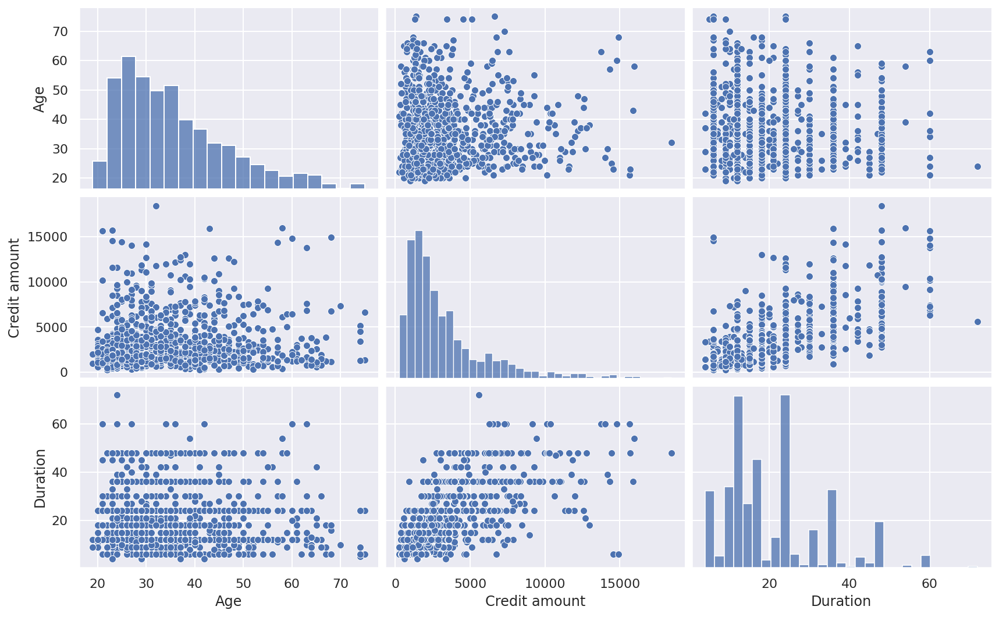

In [9]:
sns.pairplot(data, vars=["Age", "Credit amount",
             "Duration"], height=2.5, aspect=1.62)

#### Run profile report on the dataset

In [10]:
data.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Preprocessing

####  Create an ATOM classifier instance (not going to classify, just use it for PP step

In [11]:
atom = ATOMClassifier(data, n_jobs=njobs, test_size=0.2,
                      verbose=1, warnings=False, random_state=random_state)

<< ================== ATOM ================== >>
Algorithm task: multiclass classification.
Parallel processing with 8 cores.

Dataset stats ==================== >>
Shape: (1000, 9)
Scaled: False
Missing values: 577 (6.4%)
Categorical features: 4 (50.0%)
Outlier values: 34 (0.5%)
-------------------------------------
Train set size: 800
Test set size: 200
-------------------------------------



####  Check if it's worth to log numerical features

In [12]:
atom.distribution("Credit amount")

,ks,p_value
lognorm,0.0438,0.0420
pearson3,0.0637,0.0006
beta,0.0641,0.0005
expon,0.1116,0.0000
norm,0.1648,0.0000
invgauss,0.2611,0.0000
triang,0.3903,0.0000
uniform,0.5572,0.0000
weibull_min,0.8109,0.0000
weibull_max,0.8583,0.0000


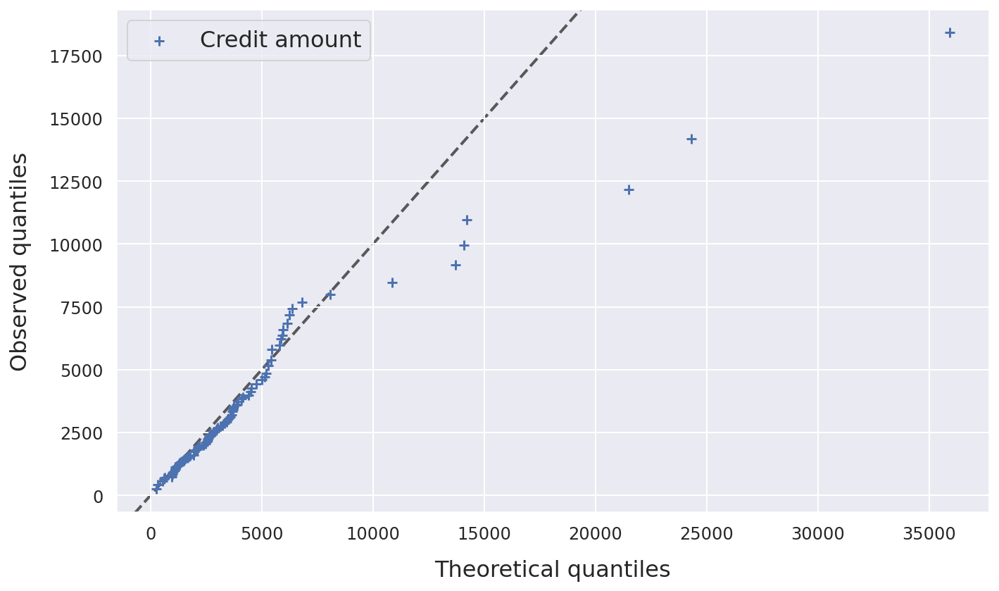

In [13]:
atom.plot_qq("Credit amount", distribution="lognorm")

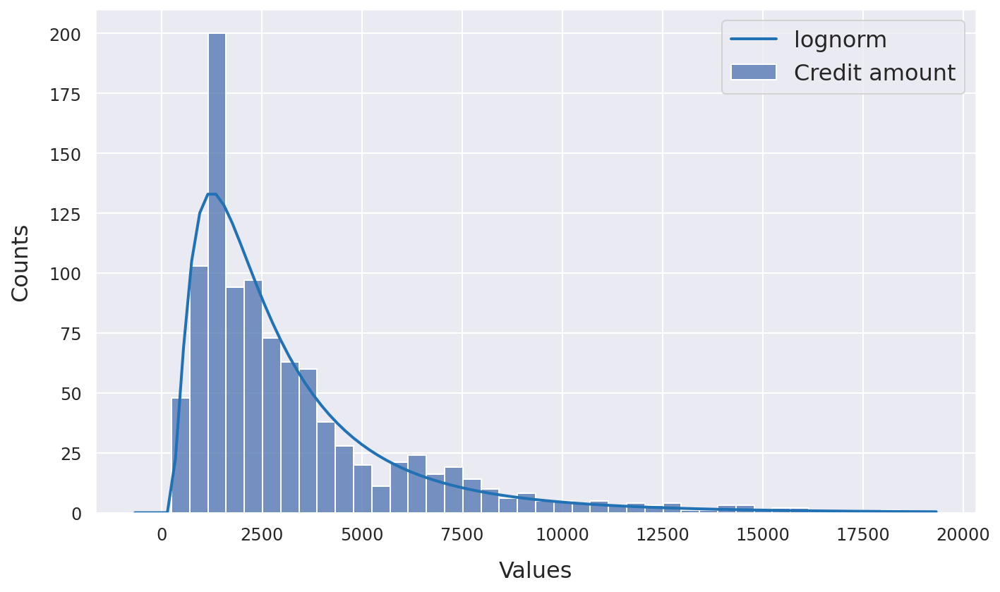

In [14]:
atom.plot_distribution("Credit amount", distribution="lognorm")

Define transfoms that may prove to be useful (or not)

In [15]:
def log_transform(x):
    return np.log1p(x + 1)


log_cols = ["Age", "Credit amount", "Duration"]
log_transformer = FunctionTransformer(log_transform)
kb = KBinsDiscretizer(n_bins=10, encode="onehot", strategy="quantile")

#### PP sequence

Choice of preprocessing steps strongly affects clustering results. Feel free to play.

In [16]:
atom.impute(strat_cat="unknown")
atom.clean(drop_min_cardinality=False)
atom.encode()  # frac_to_other=0.05)
atom.add(log_transformer, columns=log_cols)
# atom.add(kb, columns = log_cols)
atom.add(StandardScaler())
# atom.add(MinMaxScaler())
atom.gauss()
# atom.add(kb, columns = log_cols)

Fitting Imputer...
Imputing missing values...
Applying data cleaning...
Fitting Encoder...
Encoding categorical columns...
Fitting FunctionTransformer...
Applying FunctionTransformer to the dataset...
Fitting StandardScaler...
Applying StandardScaler to the dataset...
Making features Gaussian-like...


#### Have a look at the transformed dataset's profile

In [17]:
atom.X.profile_report()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

#### Transformed dataset

In [18]:
X = atom.X
X.head()

,Age,Sex,Job,Housing_own,Housing_rent,Housing_free,Saving accounts_quite rich,Saving accounts_moderate,Saving accounts_little,Saving accounts_unknown,Saving accounts_rich,Checking account_unknown,Checking account_rich,Checking account_little,Checking account_moderate,Credit amount,Duration
0,0.6346,-0.6722,0.0709,0.643,-0.4764,-0.3471,3.8730,-0.3448,-1.2058,-0.4863,-0.2233,1.2344,-0.2717,-0.6217,-0.587,0.1731,0.3403
1,-0.5927,-0.6722,0.0709,0.643,-0.4764,-0.3471,-0.2582,2.9003,-1.2058,-0.4863,-0.2233,-0.8101,3.6804,-0.6217,-0.587,-0.7730,-1.7882
2,-1.2232,-0.6722,-1.3357,0.643,-0.4764,-0.3471,-0.2582,-0.3448,0.8293,-0.4863,-0.2233,-0.8101,-0.2717,1.6086,-0.587,-0.3894,0.4975
3,-1.4051,-0.6722,0.0709,0.643,-0.4764,-0.3471,-0.2582,-0.3448,0.8293,-0.4863,-0.2233,-0.8101,3.6804,-0.6217,-0.587,0.6470,1.2457
4,0.2180,-0.6722,0.0709,0.643,-0.4764,-0.3471,-0.2582,-0.3448,-1.2058,2.0564,-0.2233,1.2344,-0.2717,-0.6217,-0.587,-1.2044,-0.7095


#### Distribution of distances in the dataset

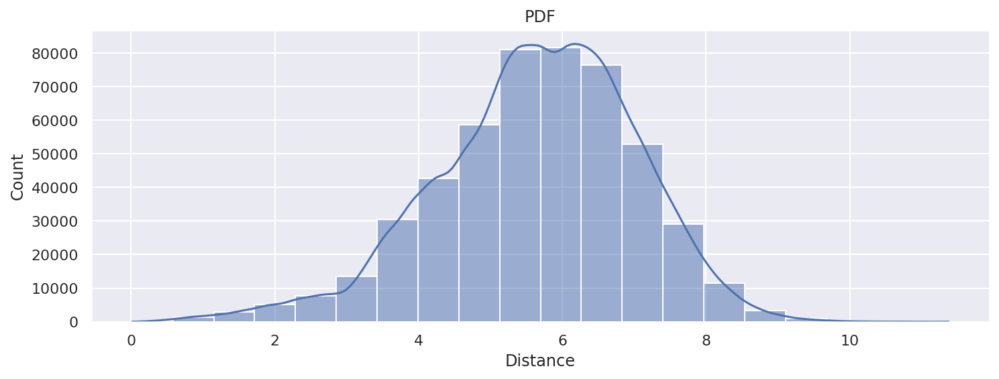

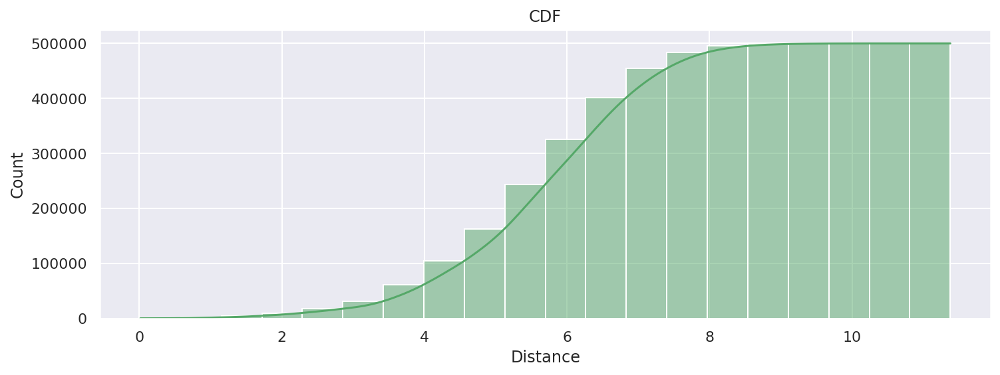

In [19]:
distr = pdist(X.values)
fig, ax = plt.subplots()
plt.setp(ax, xlabel="Distance")
plt.setp(ax, title="PDF")
_ = sns.histplot(data=distr, bins=20, kde=True)

fig, ax = plt.subplots()
plt.setp(ax, xlabel="Distance")
plt.setp(ax, title="CDF")
_ = sns.histplot(data=distr, bins=20, kde=True, cumulative=True, color="g")

### KMeans

#### Find the optimal number of clusters - Elbow method

In [20]:
from tqdm import tqdm
from time import sleep


def elbow_study(k_max: int = 20, model=KMeans):
    inertia = []
    with tqdm(total=(k_max-1)*10) as pbar:
        for k in range(1, k_max):
            clusterer = model(k, random_state=random_state)
            X_km = clusterer.fit(X)
            inertia.append(np.sqrt(X_km.inertia_))
            sleep(0.1)
            pbar.update(10)

    d = {}
    for k in range(2, k_max-1):
        i = k-1
        d[k] = (inertia[k-1]-inertia[k])/(inertia[k-2]-inertia[k-1])
    key_min = min(d.keys(), key=(lambda k: d[k]))

    plt.plot(range(1, k_max), inertia, marker="s")
    plt.title("The Elbow Method using Inertia")
    plt.xlabel("Number of clusters, k")
    plt.ylabel("Inertia")
    axes = plt.gca()
    y_min, y_max = axes.get_ylim()
    plt.vlines(key_min, y_min, y_max, colors="orange", linestyles="dashed")
    plt.show()

    plt.plot(range(2, k_max-1), [x for x in d.values()], marker="s")
    plt.title("The Elbow Method using Inertia")
    plt.xlabel("Number of clusters, k")
    plt.ylabel("Comparative decrease in inertia")
    plt.vlines(key_min, 0, 3, colors="g", linestyles="dashed")
    plt.hlines(d[key_min], 0, k_max, colors="r", linestyles="dashed")
    plt.show()

    print(f"Min Elbow score is {d[key_min]:.4f} for n_clusters = {key_min}")

100%|█████████████████████████████████████████████████████████████████████████████████| 190/190 [00:19<00:00,  9.67it/s]


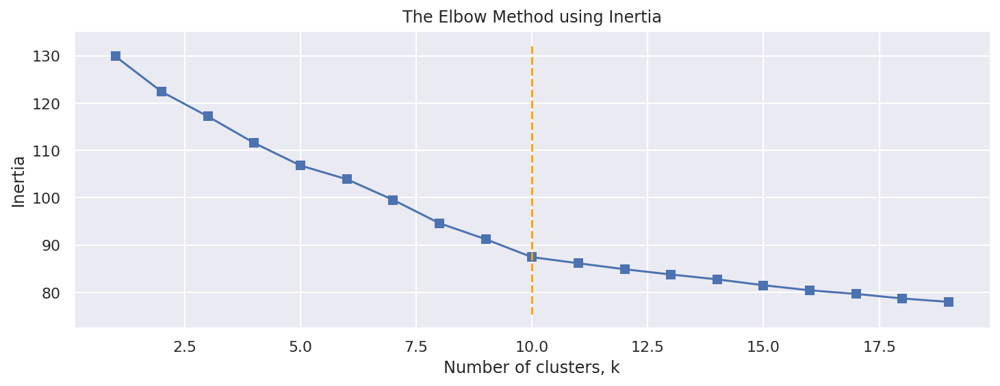

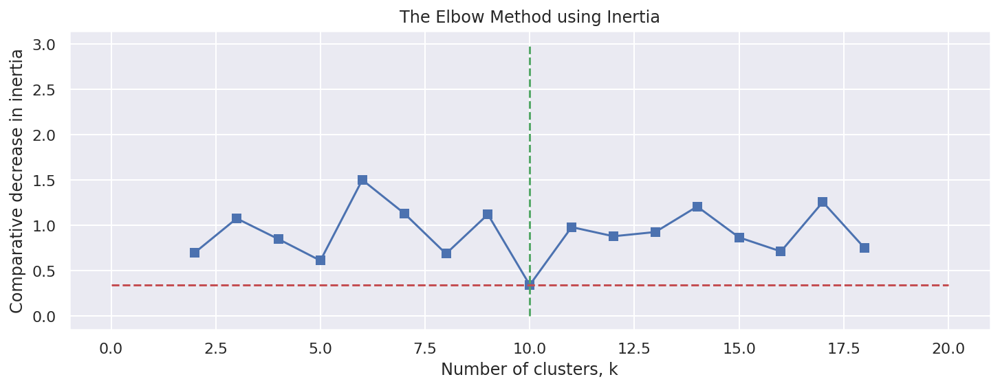

Min Elbow score is 0.3404 for n_clusters = 10


In [21]:
elbow_study()

We can see that the optimal number of clusters is 10.

####  Davies-Bouldin score for KMeans

Text(0.5, 1.0, 'Davies-Bouldin score vs. n_clusters')

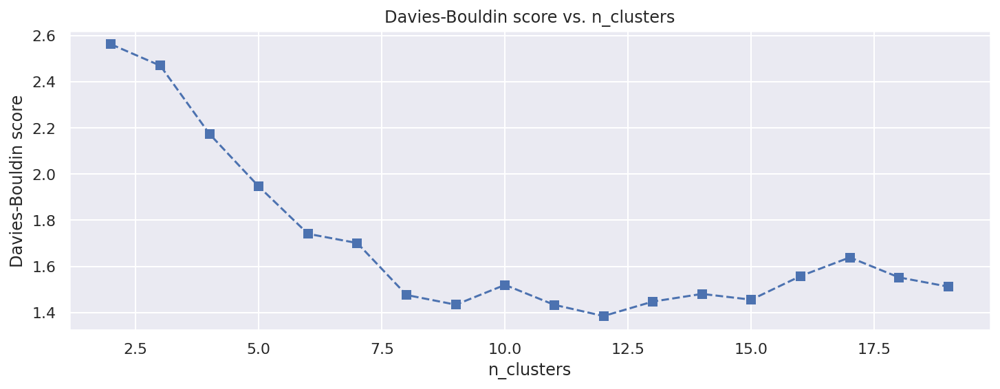

In [22]:
# Davies Bouldin score for K means
from sklearn.metrics import davies_bouldin_score


def get_kmeans_score(data, center):
    # instantiate kmeans
    kmeans = KMeans(n_clusters=center)
    # Then fit the model to your data using the fit method
    model = kmeans.fit_predict(data)
    # Calculate Davies Bouldin score
    score = davies_bouldin_score(data, model)
    return score


scores = []
n_clusters = list(range(2, 20))
for n in n_clusters:
    scores.append(get_kmeans_score(X.values, n))

plt.plot(n_clusters, scores, linestyle='--', marker='s', color='b')
plt.xlabel("n_clusters")
plt.ylabel("Davies-Bouldin score")
plt.title("Davies-Bouldin score vs. n_clusters")

Davies-Bouldin criteria suggests 12 clusters. It is not very far from 10, given by Elbow method.

#### Find the optimal number of clusters - Silhuette plot

Parameters of clustering models:  

KMeans:  
- n_clusters=8, *, init='k-means++', n_init=10, max_iter=300, tol=0.0001, verbose=0, random_state=None, copy_x=True, algorithm='auto'  

GaussianMixture:  
- n_components=1, *, covariance_type='full', tol=0.001, reg_covar=1e-06, max_iter=100, n_init=1, init_params='kmeans',   weights_init=None, means_init=None, precisions_init=None, random_state=None, warm_start=False, verbose=0, verbose_interval=10  

DBSCAN:  
- eps=0.5, *, min_samples=5, metric='euclidean', metric_params=None, algorithm='auto', leaf_size=30, p=None, n_jobs=None  

AgglomerativeClustering:  
- n_clusters=2, *, affinity='euclidean', memory=None, connectivity=None, compute_full_tree='auto', linkage='ward', distance_threshold=None, compute_distances=False
 

In [23]:
def silhuette_study(model=KMeans, **p):
    range_iter = np.linspace(p["min"], p["max"], p["steps"])
    range_iter = [round(x, 1) for x in range_iter]
    scores = {}
    silhuette_min = {}
    with tqdm(total=p["steps"]*10) as pbar:
        for it in range_iter:
            fig, ax1 = plt.subplots()
            ax1.set_xlim([-0.1, 1])
            ax1.set_ylim([0, len(X) + (it + 1) * 10])
            if model == GaussianMixture:
                cluster_labels = model(
                    n_components=int(it), random_state=random_state).fit_predict(X)
                iter_name = "n_clusters"
            elif model == KMeans:
                cluster_labels = model(n_clusters=int(it),
                                       random_state=random_state).fit_predict(X)
                iter_name = "n_clusters"
            elif model == DBSCAN:
                cluster_labels = model(
                    eps=it, min_samples=pp["min_samples"]).fit_predict(X)
                iter_name = "eps"
            elif model == AgglomerativeClustering:
                # Iterate through number of H/Ps
                cluster_labels = AgglomerativeClustering(n_clusters=int(
                    it), linkage=pp["linkage"]).fit_predict(X.values)
                iter_name = "n_clusters"
#             print(cluster_labels.size)
            _, labels_count = np.unique(cluster_labels, return_counts=True)
            if len(labels_count) >= 2:
                silhouette_avg = silhouette_score(X.values, cluster_labels)
                scores[it] = silhouette_avg
                # Compute the silhouette scores for each sample
                sample_silhouette_values = silhouette_samples(
                    X, cluster_labels)
                y_lower = 10
                silhuette_min[it] = 1

                for i, _ in enumerate(range_iter):
                    # Aggregate the silhouette scores for samples belonging to
                    # cluster i, and sort them
                    ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
                    ith_cluster_silhouette_values.sort()
                    size_cluster_i = ith_cluster_silhouette_values.shape[0]
                    y_upper = y_lower + size_cluster_i
                    color = cm.nipy_spectral(float(i) / it)
                    ax1.fill_betweenx(
                        np.arange(y_lower, y_upper),
                        0,
                        ith_cluster_silhouette_values,
                        facecolor=color,
                        edgecolor=color,
                        alpha=0.7,
                    )
                    y_lower = y_upper + 10  # 10 for the 0 samples
                    # Find min value of Silhuette score in iteration
                    if len(ith_cluster_silhouette_values) > 1 and \
                            min(ith_cluster_silhouette_values) < silhuette_min[it]:
                        silhuette_min[i] = min(
                            ith_cluster_silhouette_values)
                ax1.set_title(f"Silhouette plot for {iter_name} = {it}")
                ax1.set_xlabel("Silhouette coefficient values")
                ax1.set_ylabel("Cluster label")
                # The vertical line for average silhouette score of all values
                ax1.axvline(x=silhouette_avg, color="red", linestyle="dashed")
                ax1.text(0.805, 40, f"Score = {silhouette_avg:.4f}")
                # Clear the yaxis ticks
                ax1.set_yticks([])
                ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
                sleep(0.1)
                pbar.update(10)
    plt.show()

    # Best silhouette_avg
    key_max = max(scores.keys(), key=(lambda k: scores[k]))
    print(
        f"Max silhuette score is {scores[key_max]:.4f} for {iter_name} = {key_max:.1f}\n")
    print("""Let's find the number of clusters with max value of min Silhuette score,  
    i.e. with minimum overlap.\n""")
    best_keys = sorted(silhuette_min, key=silhuette_min.get, reverse=True)[:3]
    # Set apart the first max
    best_key = best_keys[1]
    _, ax = plt.subplots()
    lists = sorted(silhuette_min.items())
    x, y = zip(*lists)
    x = [int(w) for w in x]
    plt.plot(x, y)
#     plt.axvline(best_key, c="g", linestyle="--")
#     plt.axhline(silhuette_min[best_key], c="r", linestyle="--")
    ax.set_xlim([0, p["max"]+1])
    plt.suptitle(
        f"Min values of Silhuette score for {iter_name}\n(the higher the better)")
    _ = plt.show()
    print(f"Best keys with max values of min silhuette scores : {best_keys}")
    silh_scores = pd.DataFrame.from_dict(scores, orient='index',
                                         columns=["Silhuette score"])
    silh_scores.rename_axis(index=iter_name, inplace=True)
    silh_scores_nice = silh_scores.T.style.highlight_max(
        props='color:orange', axis=1)

    return(silh_scores_nice)

#### Run  Silhuette study with KMeans

100%|█████████████████████████████████████████████████████████████████████████████████| 190/190 [00:21<00:00,  8.87it/s]


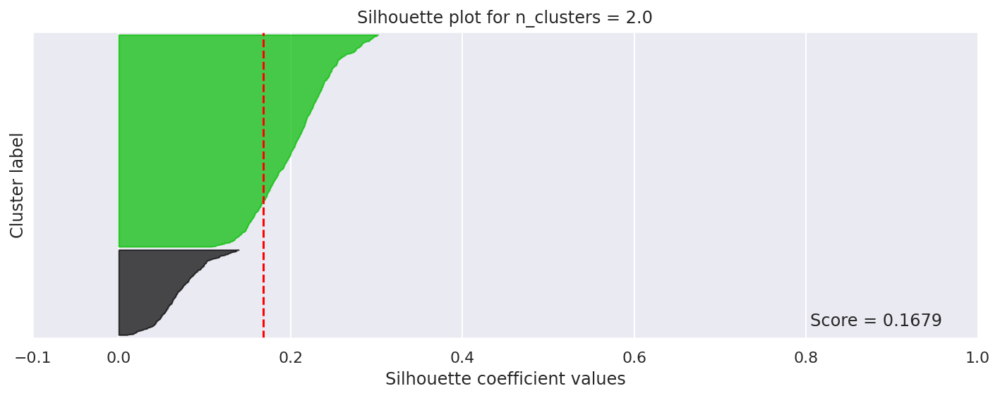

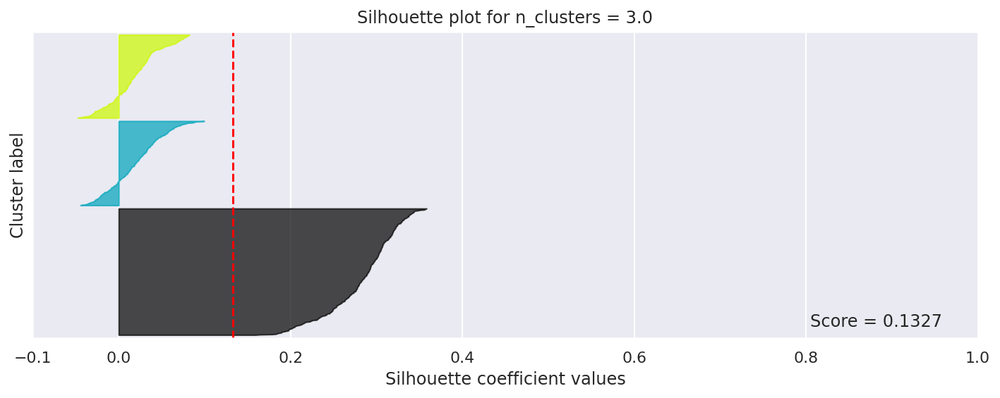

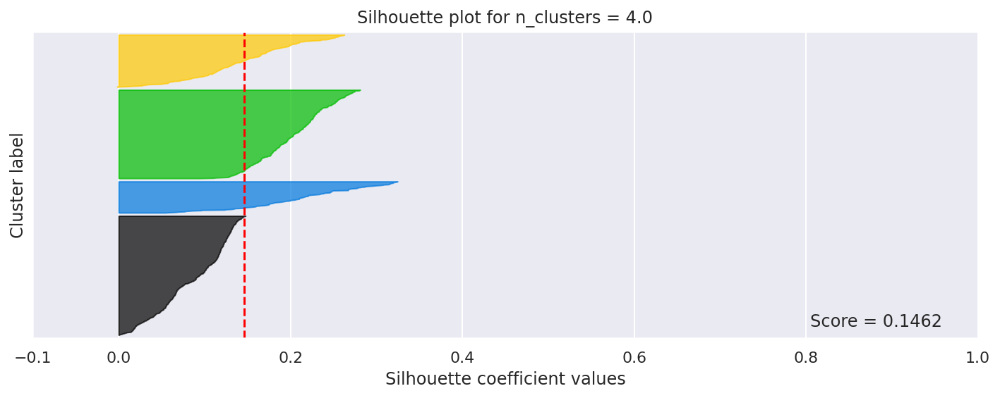

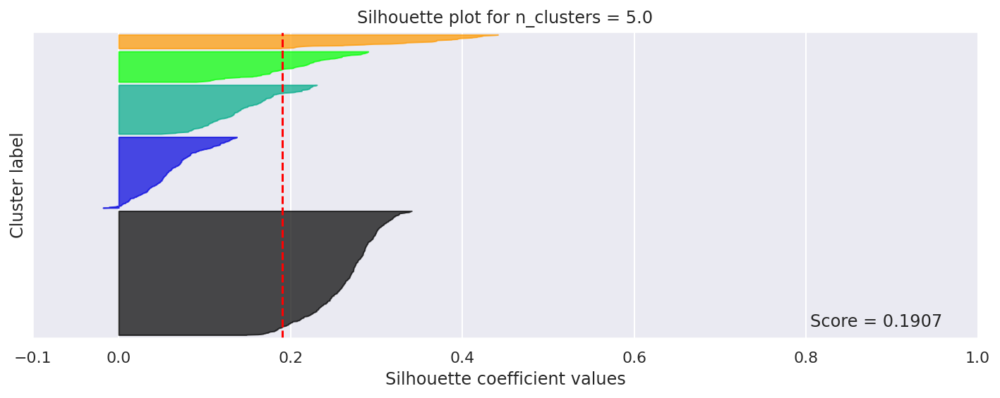

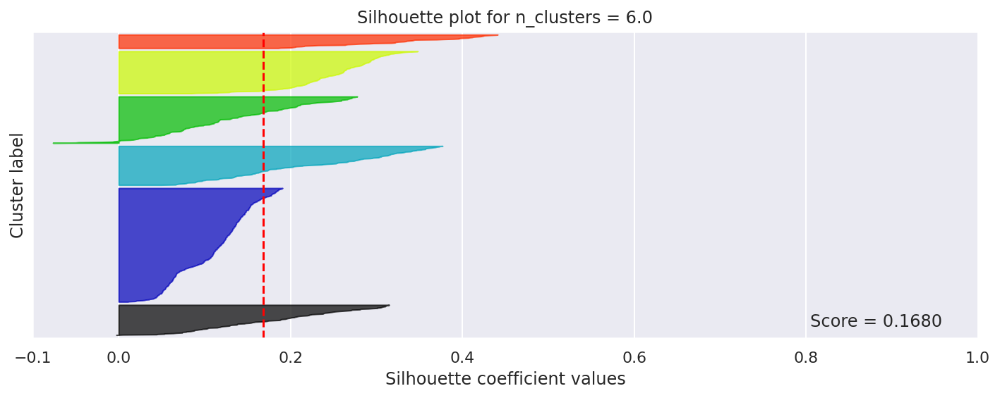

...

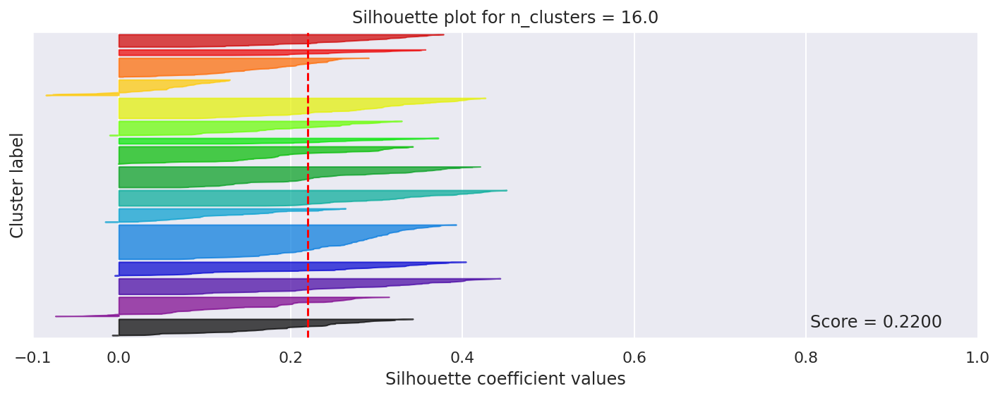

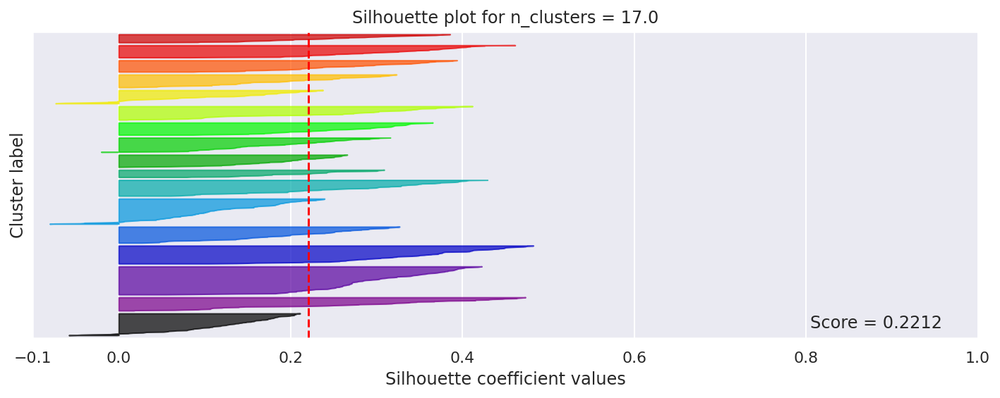

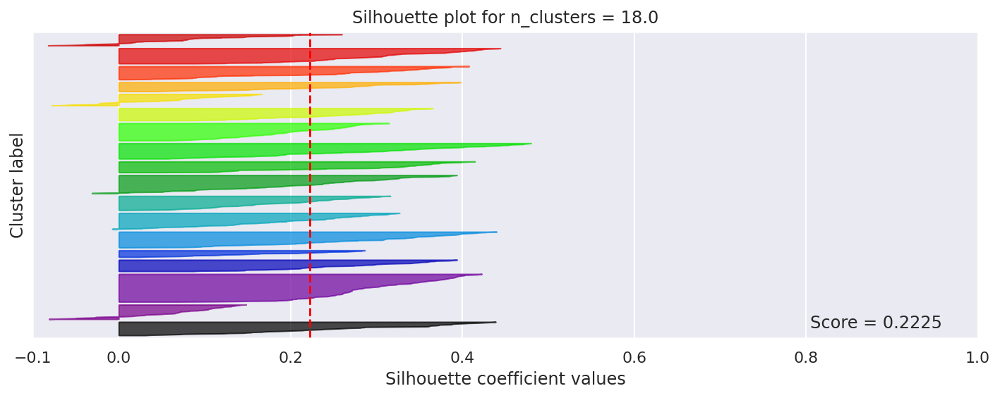

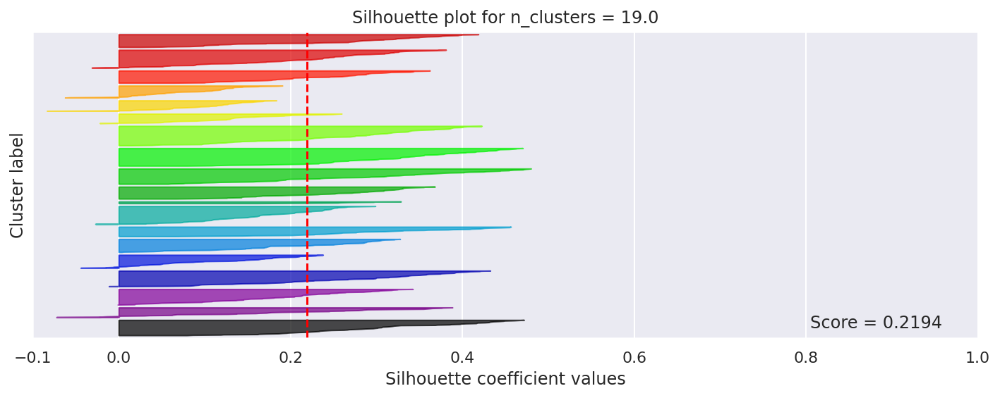

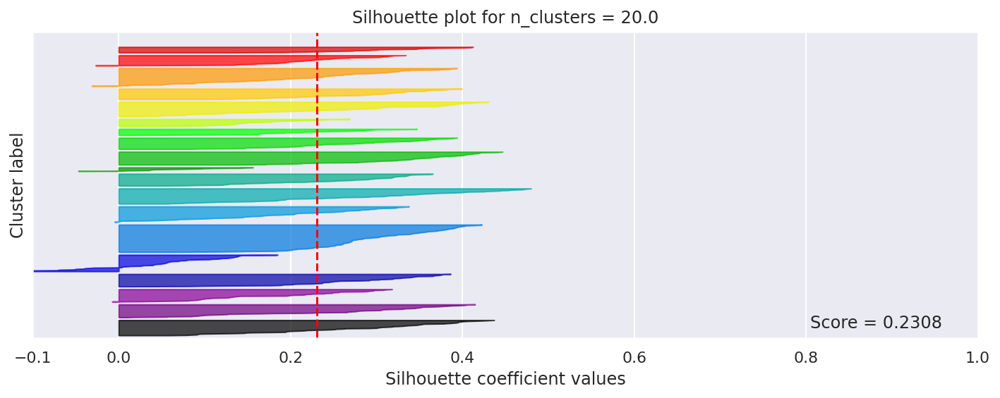

Max silhuette score is 0.2618 for n_clusters = 14.0

Let's find the number of clusters with max value of min Silhuette score,  
    i.e. with minimum overlap.



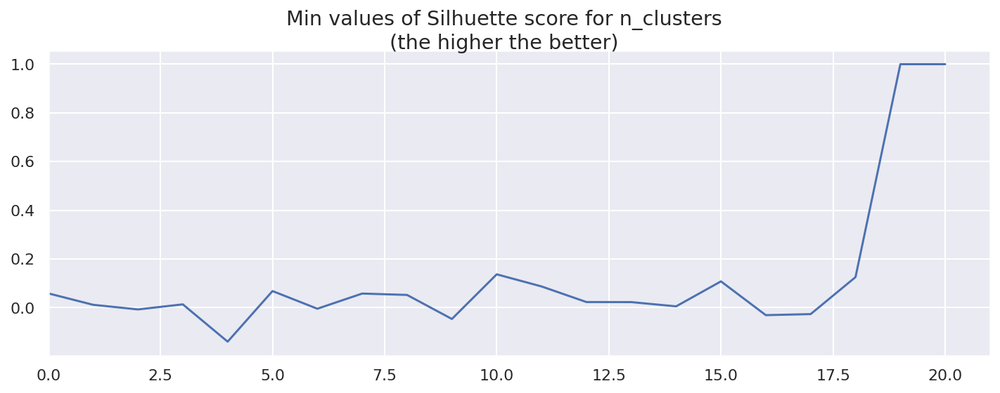

Best keys with max values of min silhuette scores : [19.0, 20.0, 10.0]


In [24]:
pp = {"min": 2, "max": 20, "steps": 19}
silhuette_scores = silhuette_study(model=KMeans, **pp)

In [25]:
silhuette_scores

n_clusters,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,15.0,16.0,17.0,18.0,19.0,20.0
Silhuette score,0.1679,0.1327,0.1462,0.1907,0.1680,0.1978,0.1976,0.2159,0.2293,0.2407,0.2469,0.2509,0.2618,0.2130,0.2200,0.2212,0.2225,0.2194,0.2308


The silhuette score is the highest for n_clusters=14, although negative values of Silhoutte score indicate presence of misclassifications. Taking into account minimal clusters' overlap, the optimal values for n_clusters are 9 and 10.

So far we have:  
* Elbow -           10 clusters  
* David-Bouldin -   12 clusters  
* Silhuette -      14 clusters  

### GMM

#### Run  Silhuette study with Gaussian mixture

100%|█████████████████████████████████████████████████████████████████████████████████| 190/190 [00:07<00:00, 24.05it/s]


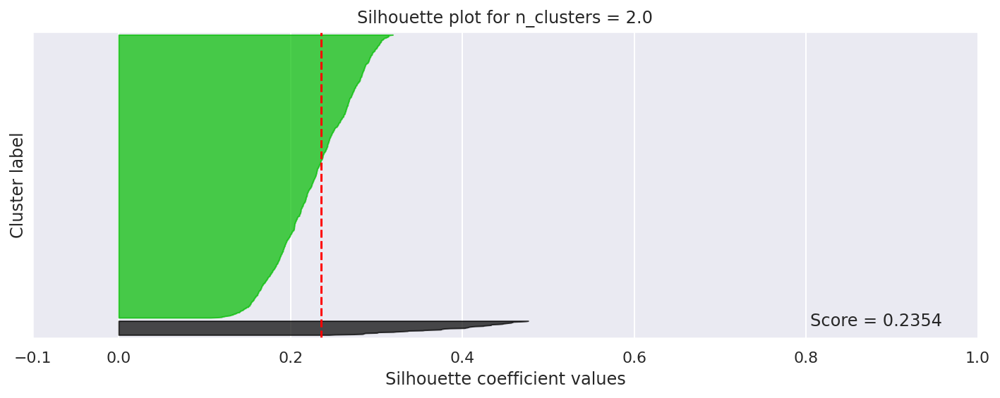

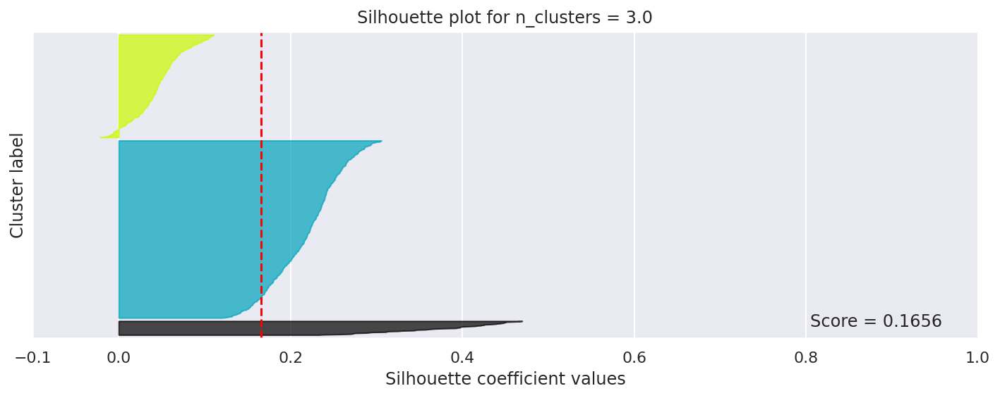

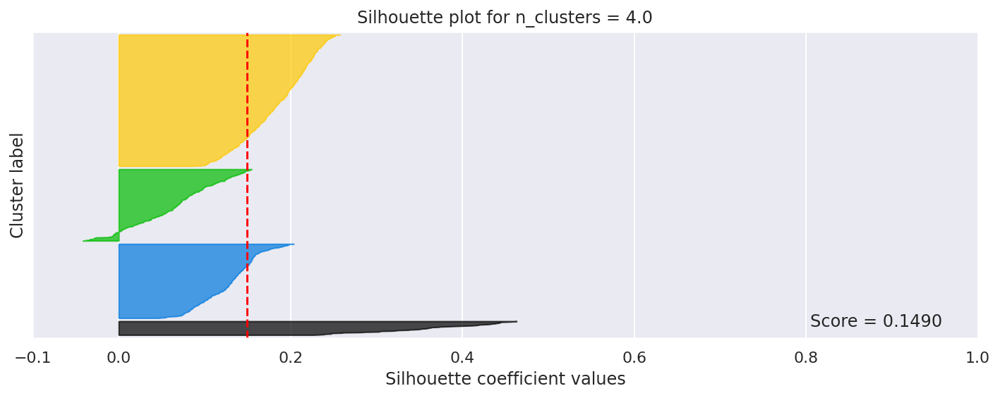

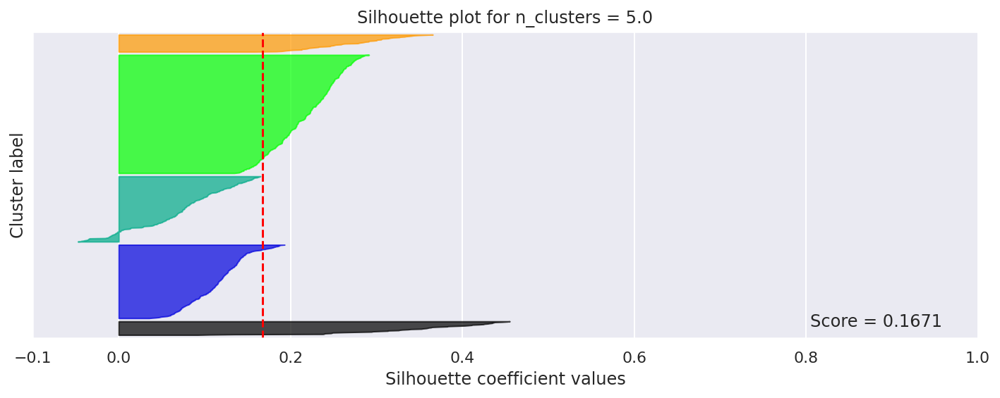

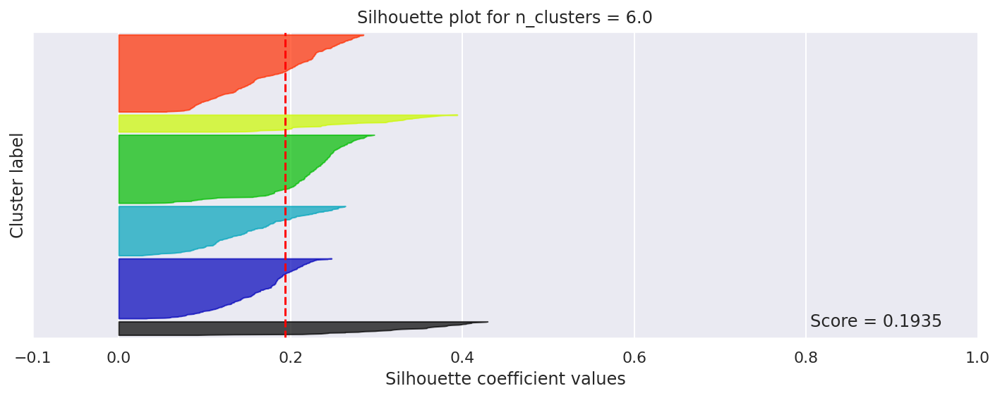

...

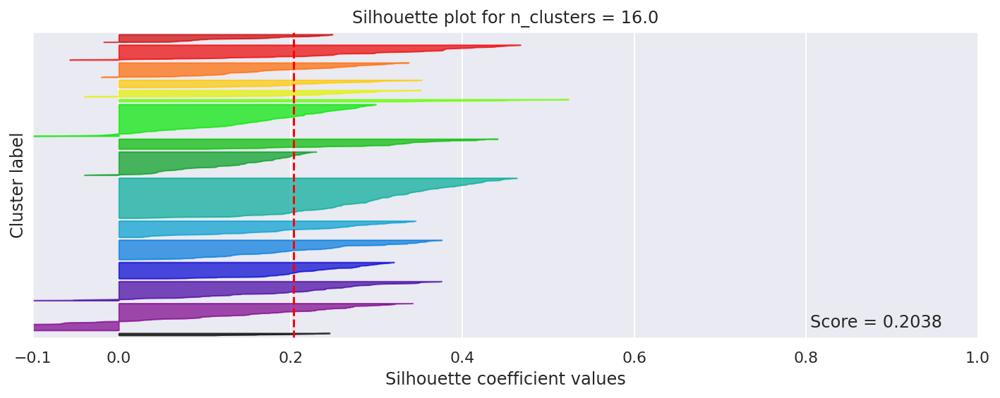

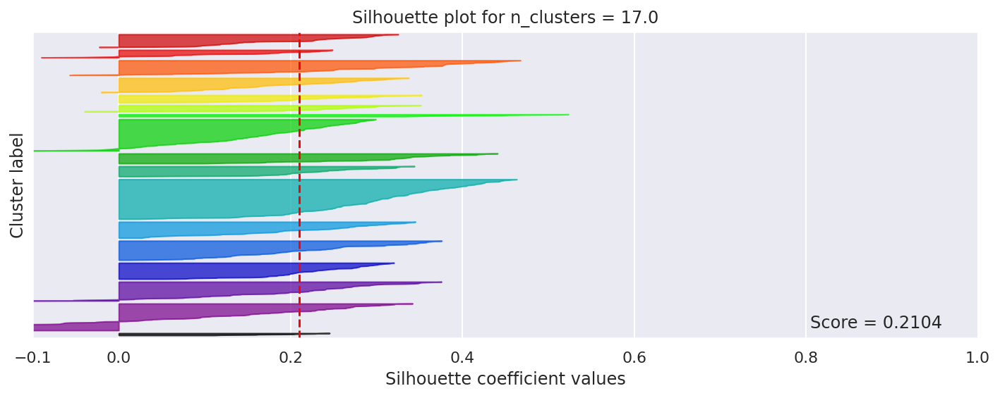

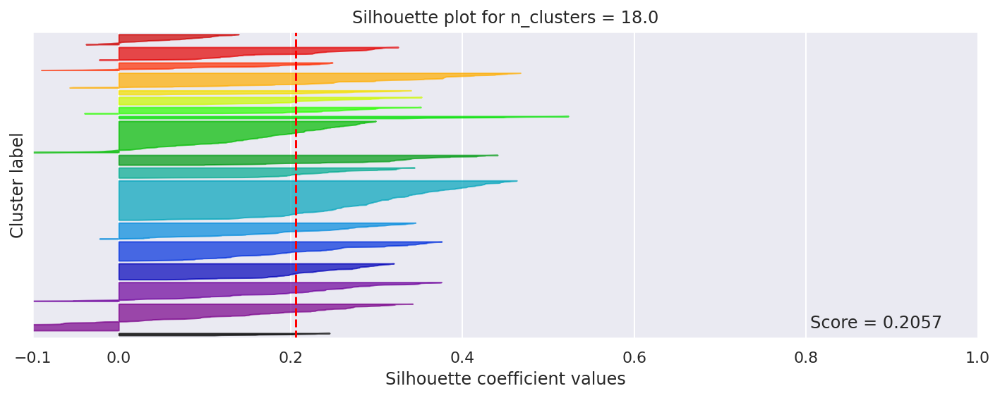

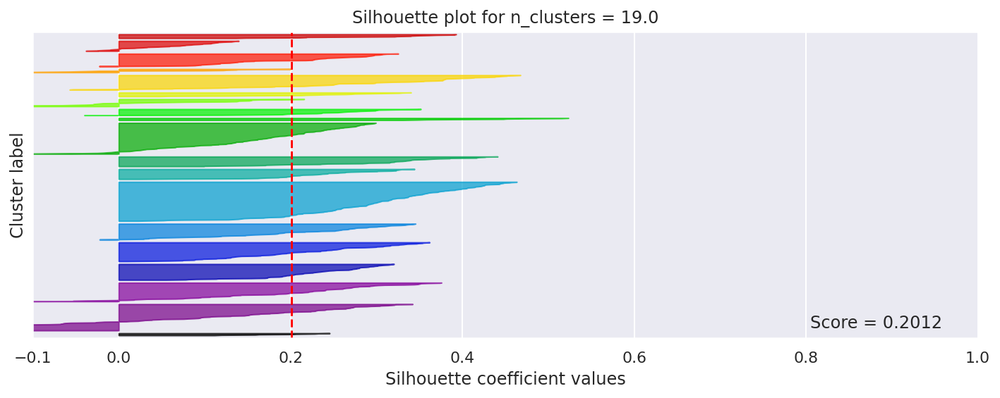

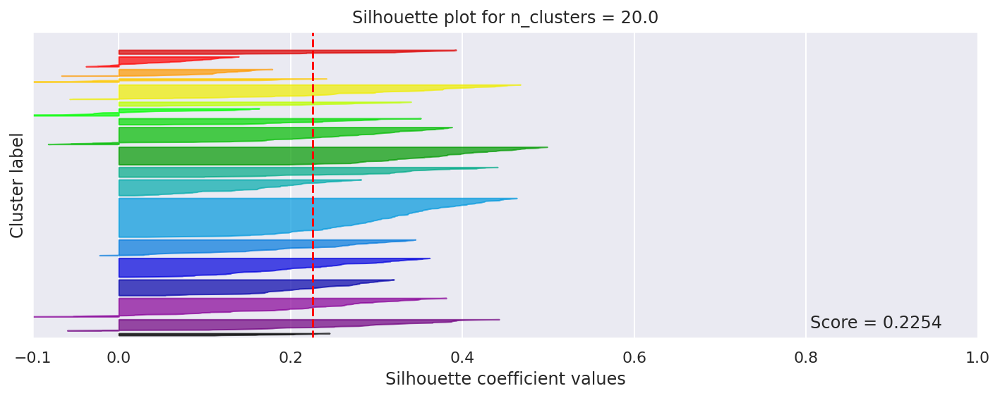

Max silhuette score is 0.2440 for n_clusters = 13.0

Let's find the number of clusters with max value of min Silhuette score,  
    i.e. with minimum overlap.



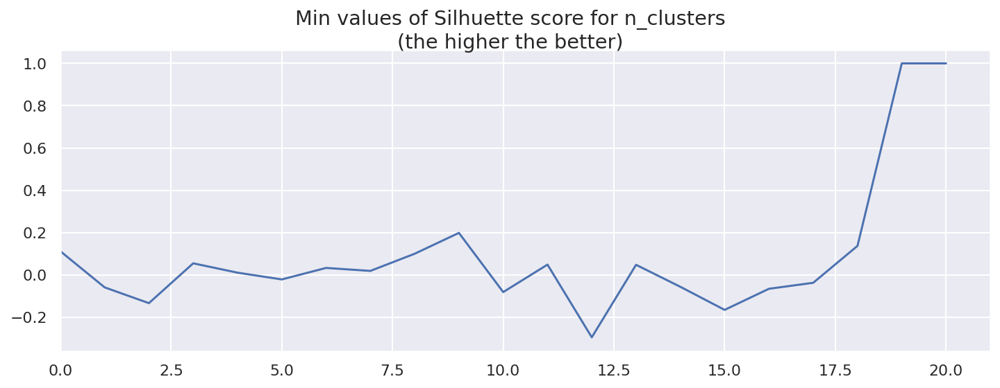

Best keys with max values of min silhuette scores : [19.0, 20.0, 9.0]


n_clusters,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,15.0,16.0,17.0,18.0,19.0,20.0
Silhuette score,0.2354,0.1656,0.1490,0.1671,0.1935,0.2038,0.2072,0.2063,0.2147,0.2034,0.2296,0.2440,0.2172,0.1965,0.2038,0.2104,0.2057,0.2012,0.2254


In [26]:
pp = {"min": 2, "max": 20, "steps": 19}
silhuette_study(model=GaussianMixture, **pp)

Silhuette method suggests 13 clusters. We notice that in this case all scores are positive.

#### Bayesian Information Criterion (BIC) for GMM

In [27]:
n_components = range(2, 20)
covariance_type = ['spherical', 'tied', 'diag', 'full']
score = []
for cov in covariance_type:
    for n_comp in n_components:
        gmm = GaussianMixture(n_components=n_comp, covariance_type=cov)
        gmm.fit(X.values)
        score.append((cov, n_comp, gmm.bic(X.values)))
scores = pd.DataFrame.from_records(score)
scores.columns = ["Covariance type", "n_clusters", "score"]
scores["score"] = scores["score"].apply(lambda x: int(round(x, -2)))
# by, axis=0, ascending=True, inplace=False
scores.sort_values(by="score", axis=0, inplace=True)
scores[:10].T

,53,52,69,50,70,51,66,49,71,68
Covariance type,diag,diag,full,diag,full,diag,full,diag,full,full
n_clusters,19,18,17,16,18,17,14,15,19,16
score,-91800,-90800,-88000,-88000,-87400,-86900,-85900,-85700,-85700,-85600


The lower the BIC score, the better is the model. The number of choice is 19.  
Thus, for GMM we have:  
* Silhuette - 13 clusters  
* BIC - 19 clusters

### DBSCAN

#### Run  DBSCAN on an eps, min_samples grid

In [52]:
clusters = pd.DataFrame()
max_length = 1
eps_range = np.linspace(2.5, 5.0, 16)
min_samples_range = range(10, 45, 5)
for i, eps in enumerate(eps_range):
    for j, min_samples in enumerate(min_samples_range):
        k = i*len(min_samples_range) + j
        clustering = DBSCAN(eps=eps, min_samples=min_samples,
                            n_jobs=njobs).fit(X.values)
        labels = clustering.labels_
        unique, counts = np.unique(labels, return_counts=True)
        if len(unique) > max_length:
            max_length = len(unique)
        clusters = pd.concat([clusters, pd.Series(counts)],
                             axis=1)
clusters = clusters.fillna(0).astype("int")
clusters.index = list(range(-1, max_length-1))
clusters.rename_axis(index=["cluster"], inplace=True)
clusters.columns = list(range(0, len(eps_range)*len(min_samples_range)))
clusters.rename(columns=lambda k: str(round(eps_range[k//len(min_samples_range)], 1))+", " + str(
    min_samples_range[k % len(min_samples_range)]), inplace=True)
clusters.rename_axis(columns=["eps, min_samples"], inplace=True)
clusters = clusters.applymap((lambda x: "" if x == 0 else x))
clusters = clusters.loc[:, clusters.loc[-1, :]
                        < X.shape[0]*0.1].sort_values(by=-1, axis=1)
counts = clusters.apply(lambda x: x.apply(type).value_counts()).iloc[1]
max_count = max(counts)

DBSCAN results are sorted by '-1' cluster that represents outliers. Presumably, we need to find a reasonable  
compromise between the number of outliers and the number of clusters. Let's leave only the results with less  
than 10% outliers.

In [29]:
clusters[:max_count]

"eps, min_samples","5.0, 25","4.8, 20","4.8, 15","5.0, 30","4.8, 30","4.8, 25","5.0, 35","4.8, 35","4.7, 10","4.7, 30","4.7, 25","4.7, 20","4.7, 15","4.7, 35","4.5, 10","5.0, 40","4.5, 20","4.5, 15","4.3, 10","4.8, 40","4.5, 25","4.3, 15","4.5, 30","4.3, 20","4.3, 25","4.2, 10","4.3, 30","4.5, 35","4.2, 15","4.2, 20","4.3, 35","4.2, 25","4.0, 10","4.2, 30","4.0, 15","4.0, 20","4.0, 25","3.8, 10","3.8, 15","4.0, 30","3.7, 10","3.8, 20","3.7, 15","3.8, 25","3.5, 10","4.7, 40","3.7, 20","4.5, 40","3.5, 15","4.2, 35","3.8, 30","4.3, 40","3.7, 25","4.2, 40","3.3, 10","4.0, 35","3.5, 20","4.0, 40"
cluster,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
-1,2,2,2,3,3,3,3,4,4,5,5,5,5,7,8,8,9,9,9,10,10,10,11,11,12,12,14,15,15,19,20,20,21,22,30,30,32,38,40,40,42,45,48,49,50,54,56,57,64,64,64,65,76,77,82,83,93,96
0,952,952,952,951,951,951,951,950,950,949,949,949,949,948,59,951,59,59,59,950,59,58,59,58,58,58,57,57,56,56,57,56,56,55,54,54,54,53,52,51,51,50,48,50,49,946,48,57,46,55,46,55,45,46,41,50,41,821
1,46,46,46,46,46,46,46,46,46,46,46,46,46,45,888,41,887,887,54,40,887,833,887,833,833,833,833,887,833,831,833,831,831,831,828,828,828,740,740,823,650,739,650,738,650,,650,886,649,831,737,831,649,831,520,823,648,43
2,,,,,,,,,,,,,,,45,,45,45,833,,44,54,43,54,54,53,54,41,53,53,40,53,50,40,50,50,48,46,46,38,46,44,44,37,42,,43,,38,50,80,49,31,46,32,44,34,40
3,,,,,,,,,,,,,,,,,,,45,,,45,,44,43,44,42,,43,41,50,40,42,52,38,38,38,85,85,48,85,85,85,44,85,,36,,34,,43,,40,,126,,38,
4,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,38,37,,36,37,36,82,34,,83,,85,,30,,83,,85,,72,
5,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,90,,89,,90,,84,,84,,,,76,,34,,74,
6,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,68,,,
7,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,12,,,


#### DBSCAN: how to choose optimal H/P?

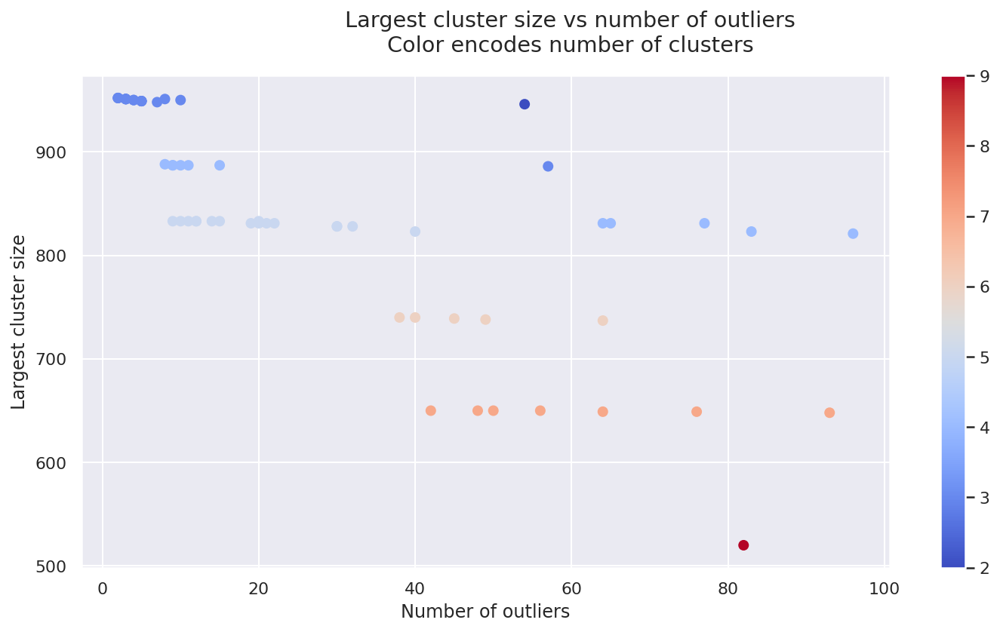

In [54]:
fig, ax = plt.subplots(figsize=(12, 6))
clusters = clusters.applymap((lambda x: 0 if x == "" else x))
max_clusters = clusters.apply("max")
# im = ax.scatter(clusters.loc[-1, :], clusters.loc[0, :],
im = ax.scatter(clusters.loc[-1, :], max_clusters,
                c=counts, cmap="coolwarm") #.astype(float)
fig.colorbar(im, ax=ax)
# plt.axhline(y=50, linestyle="--", c="blue")

ax.set_xlabel("Number of outliers")
ax.set_ylabel("Largest cluster size")
plt.suptitle(
    "Largest cluster size vs number of outliers\nColor encodes number of clusters")
plt.show()

The plot above shows that most DBSCAN predictions have just a few possible values of the largest cluster. 

#### Run Elbow study on DBSCAN

As inertia is a sensible measure only for spherical clusters, we have to use other metrics for **DBSCAN**.  

We will calculate the distance to the nearest n points for each point, and then sort and plot the results.  
Finding the position of **elbow** (or **knee** in DBSCAN-speak) will give us the best **eps**. 

**n_neighbours** is set to **min_samples**.

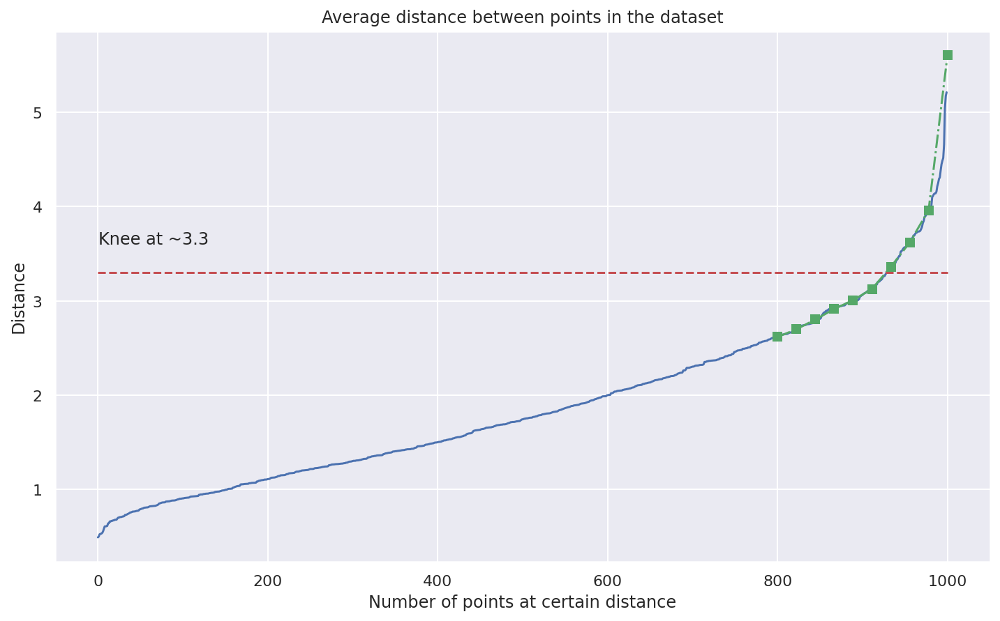

In [55]:
nnb = NearestNeighbors(n_neighbors=15)
nbrs = nnb.fit(X)
distances, indices = nbrs.kneighbors(X)
distances = np.mean(distances, axis=1)
distances = np.sort(distances, axis=0)
fig, ax = plt.subplots(figsize=(12, 7))

# Piecewise linear approximation
p10 = np.poly1d(np.polyfit(list(range(1000)), distances, 100))
plt.plot(list(range(1000)), distances)
x = np.linspace(800, 1000, 10)
plt.plot(x, p10(x), linestyle='-.', marker='s', color='g')
ax.text(0.805, 3.6, "Knee at ~3.3")
plt.hlines(3.3, 0, 1000, colors="r", linestyles="dashed")

ax.set_xlabel("Number of points at certain distance")
ax.set_ylabel("Distance")
ax.set_title("Average distance between points in the dataset")
fig.show()

Plot kink is located at 3.1-3.5, we will explore **eps** around this value. 

#### Run Silhuette study on DBSCAN

100%|█████████████████████████████████████████████████████████████████████████████████| 220/220 [00:04<00:00, 46.06it/s]


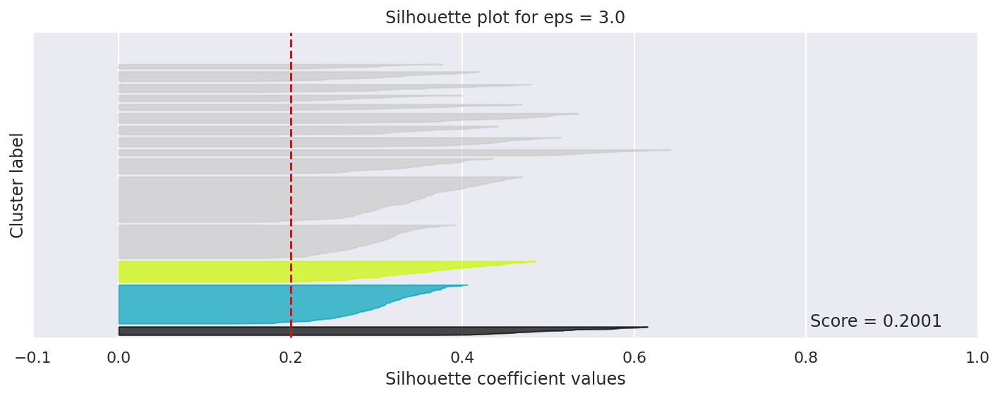

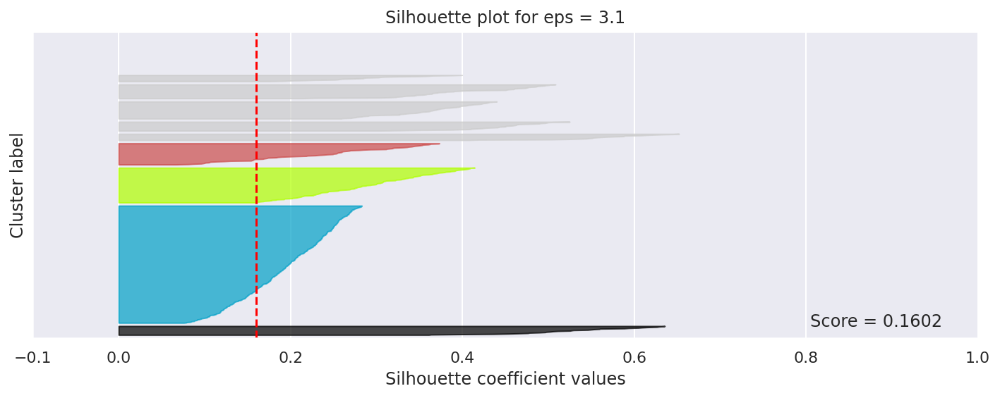

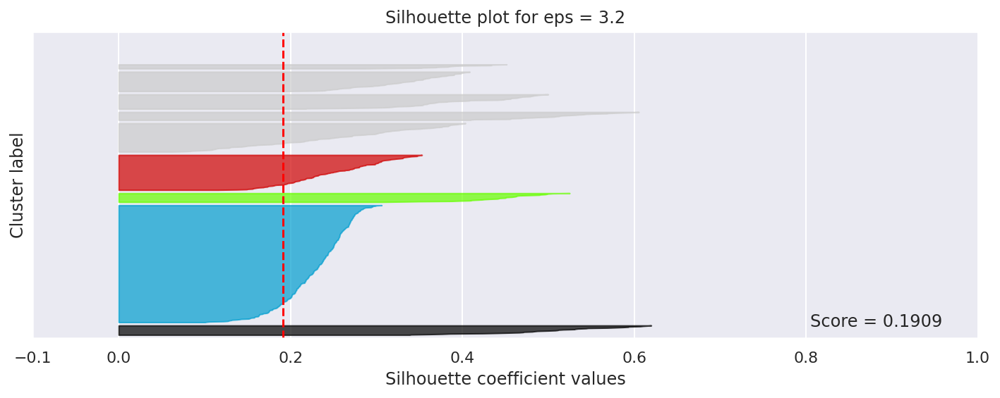

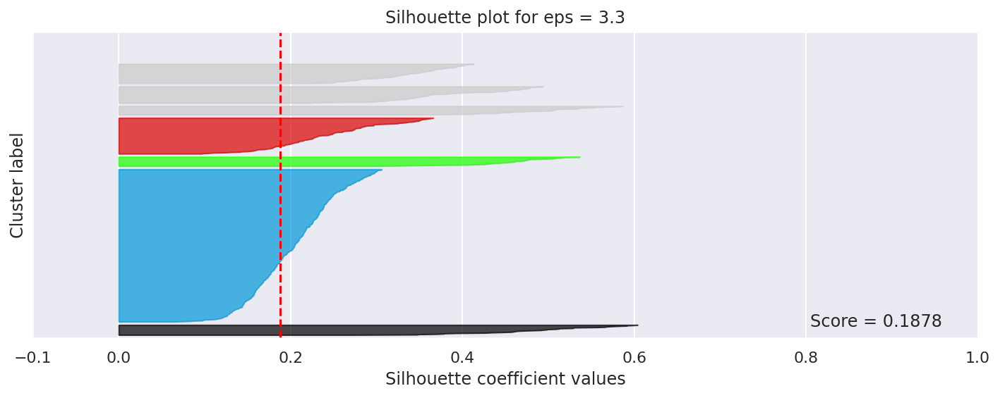

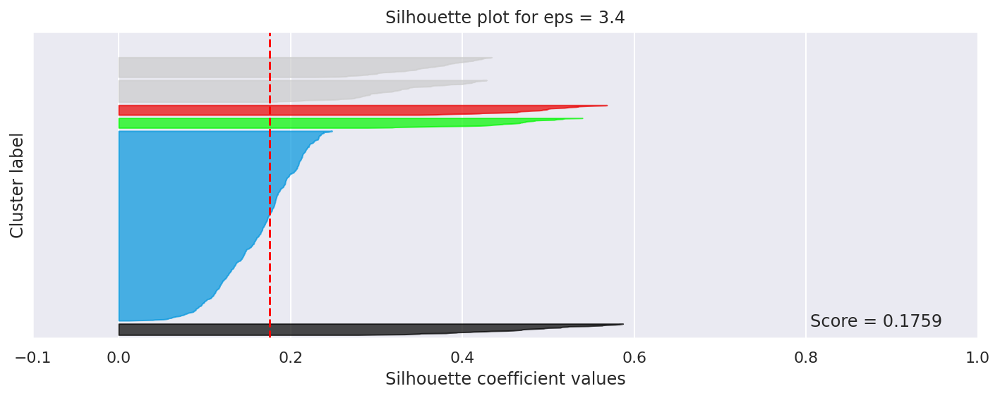

...

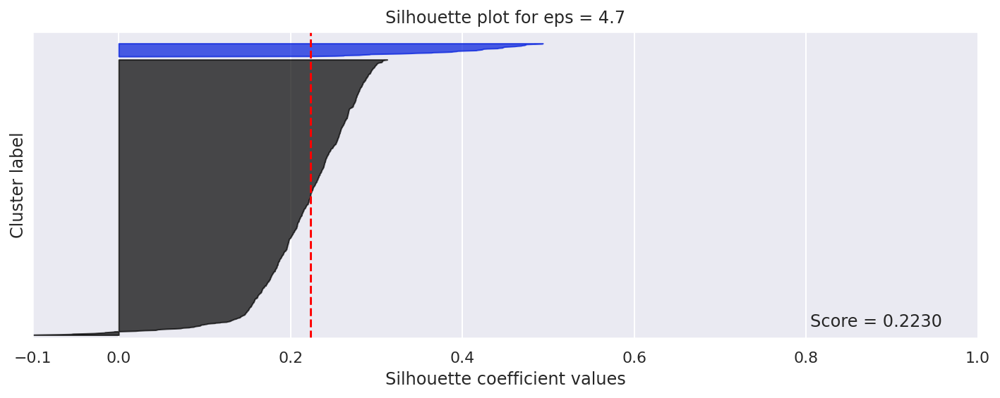

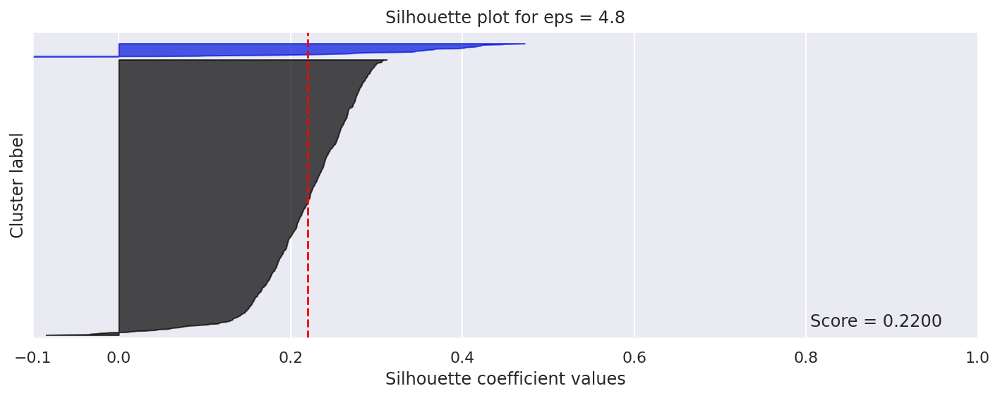

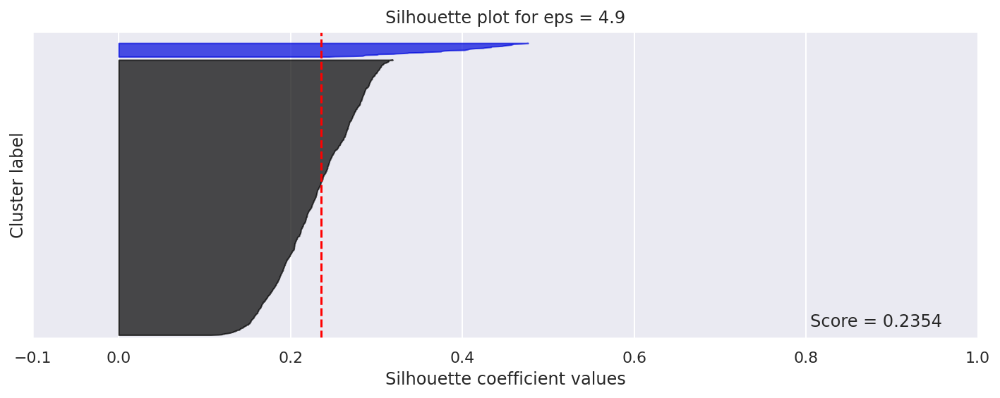

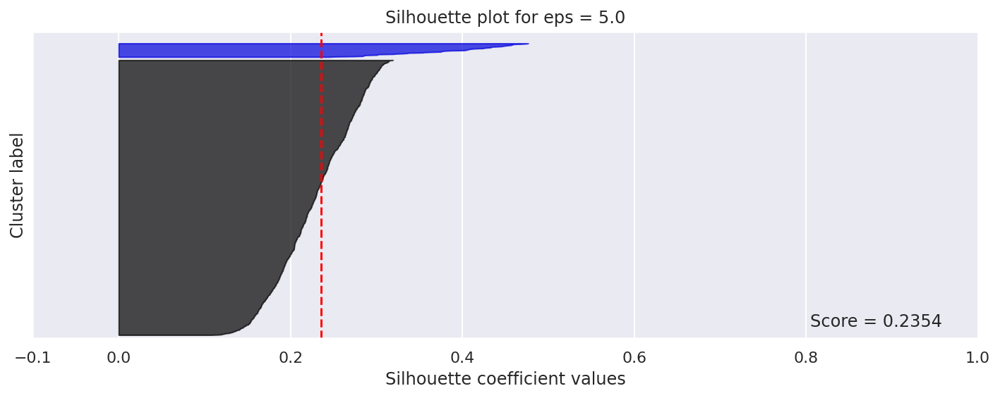

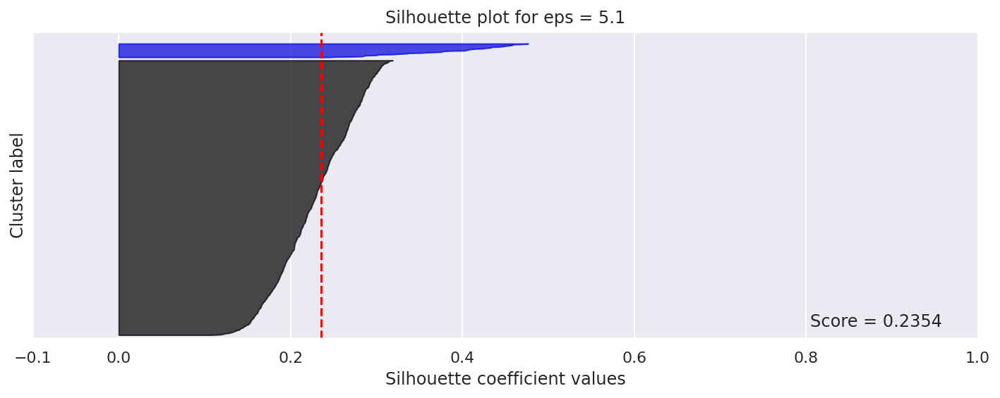

Max silhuette score is 0.2354 for eps = 4.9

Let's find the number of clusters with max value of min Silhuette score,  
    i.e. with minimum overlap.



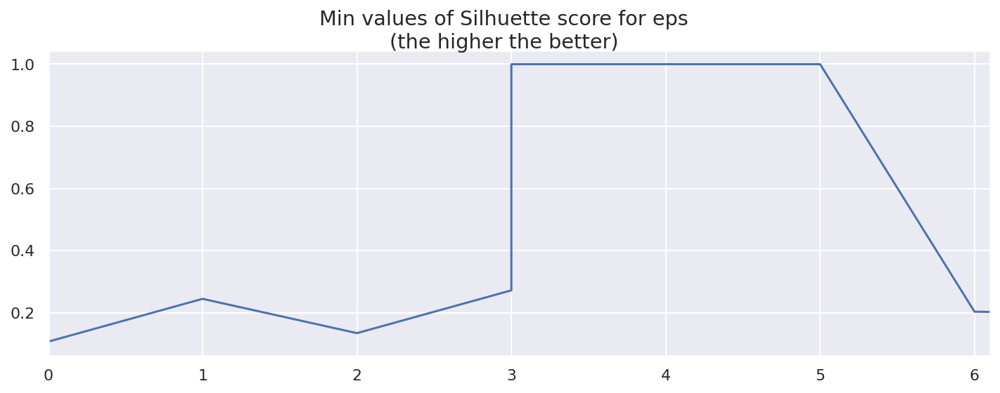

Best keys with max values of min silhuette scores : [3.1, 4, 5]


eps,3.0,3.1,3.2,3.3,3.4,3.5,3.6,3.7,3.8,3.9,4.0,4.1,4.2,4.3,4.4,4.5,4.6,4.7,4.8,4.9,5.0,5.1
Silhuette score,0.2001,0.1602,0.1909,0.1878,0.1759,0.2006,0.2102,0.2131,0.2154,0.2027,0.1961,0.1992,0.2062,0.2077,0.2080,0.2098,0.2142,0.2230,0.2200,0.2354,0.2354,0.2354


In [32]:
pp = {"min": 3.0, "max": 5.1, "steps": 22, "min_samples": 15}
silhuette_study(model=DBSCAN, **pp)

DBSCAN gives only 2 to 4 clusters with the best score for 2. Surprise!

### Agglomerative clustering

#### Iterate through linkage methods and distance thresholds

In [33]:
clusters = pd.DataFrame()
max_length = 1
ll = {1: "ward", 2: "single", 3: "complete", 4: "average"}
dist_thresh = np.linspace(3, 20, 18)
full_tree = True
for i in ll.keys():
    for j, dist in enumerate(dist_thresh):
        k = i*len(dist_thresh) + j
        clustering = AgglomerativeClustering(n_clusters=None, linkage=ll[i],
                                             compute_full_tree=full_tree, distance_threshold=dist).fit(X.values)
        labels = clustering.labels_
        unique, counts = np.unique(labels, return_counts=True)
        if len(unique) > max_length:
            max_length = len(unique)
        clusters = pd.concat([clusters, pd.Series(counts)],
                             axis=1)
clusters = clusters.fillna(0).astype("int")
clusters.index = list(range(max_length))
clusters.rename_axis(index=["cluster"], inplace=True)
clusters.columns = list(range(0, len(ll)*len(dist_thresh)))
clusters.rename(columns=lambda k: ll[k//len(dist_thresh)+1] +
                ", " + str(dist_thresh[k % len(dist_thresh)]), inplace=True)
clusters.rename_axis(columns=["linkage, dist_thresh"], inplace=True)
clusters = clusters.applymap((lambda x: "" if x == 0 else x))
counts = clusters.apply(lambda x: x.apply(type).value_counts()).iloc[0]

Show only the results with a reasonable number of clusters and minimum cluster size.  
Also remove results with only one cluster.

In [34]:
def min_nonzero(x):
    sort_x = sorted(x)
    sort_x = [x for x in sort_x if x != 0]
    return sort_x[0]


max_clusters = 20
min_cluster_size = 15

clusters = clusters.loc[:, counts < max_clusters]
clusters = clusters.applymap((lambda x: 0 if x == "" else x))
clusters = clusters.loc[:, clusters.apply(min_nonzero) >= min_cluster_size]
clusters = clusters.loc[:, clusters.loc[0, :] < 1000]
clusters = clusters.applymap((lambda x: "" if x == 0 else x))
clusters.iloc[:max_clusters]

"linkage, dist_thresh","ward, 16.0","ward, 17.0","ward, 18.0","ward, 19.0","ward, 20.0","single, 5.0","complete, 9.0","complete, 10.0","complete, 11.0","average, 7.0"
cluster,,,,,,,,,,
0,48,48,132,57,86,952,236,467,515,952
1,113,113,154,132,132,48,143,485,485,48
2,52,52,48,48,97,,48,48,,
3,63,63,63,154,154,,63,,,
4,84,84,113,113,113,,348,,,
5,63,63,63,63,100,,106,,,
6,112,112,52,52,52,,56,,,
7,56,56,56,56,56,,,,,
8,35,35,35,63,63,,,,,


#### Dendrograms for AC

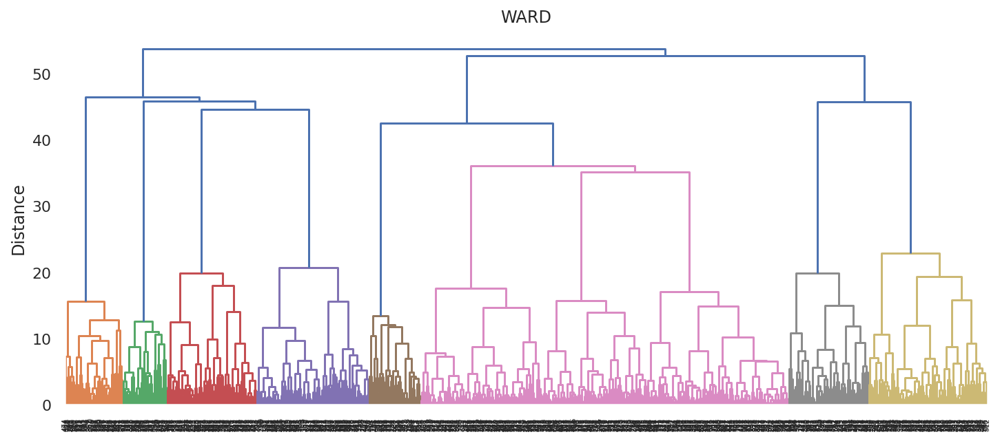

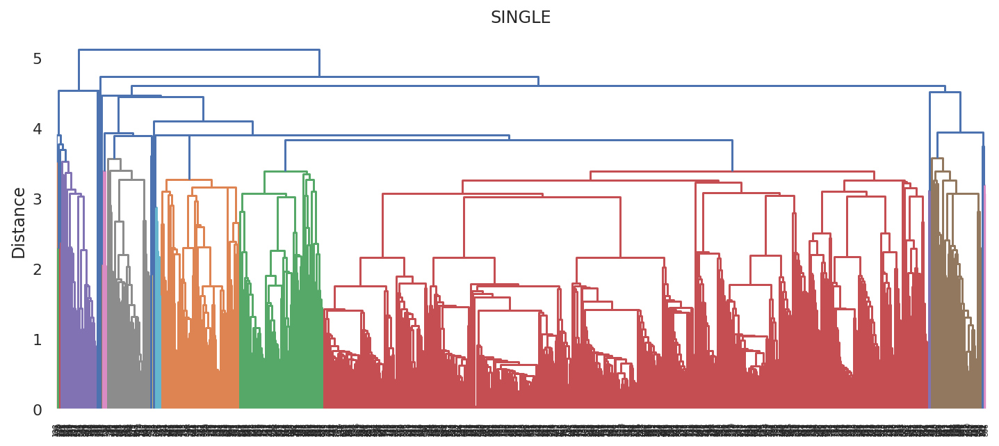

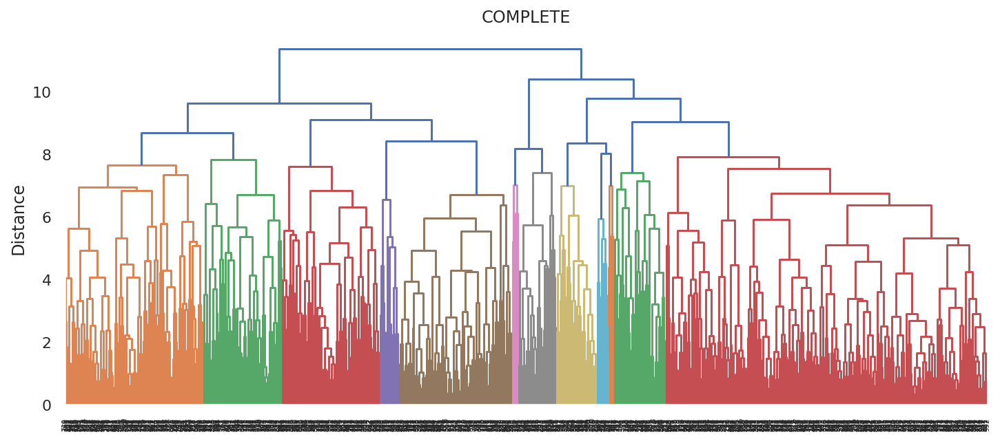

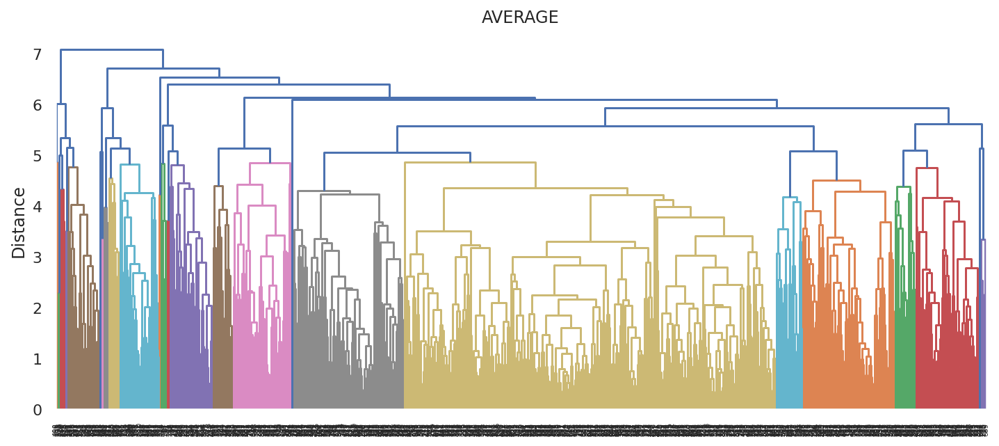

In [35]:
for i, linkage in enumerate(ll.values()):
    fig, ax = plt.subplots(figsize=(12, 5))
    ax.set_title(f"{str.upper(linkage)}", loc="center")
    ax.set_ylabel("Distance")
    ax = shc.dendrogram(shc.linkage(X.values, method=linkage))
plt.show()

#### Run Silhuette study on AC

100%|█████████████████████████████████████████████████████████████████████████████████| 190/190 [00:04<00:00, 44.34it/s]


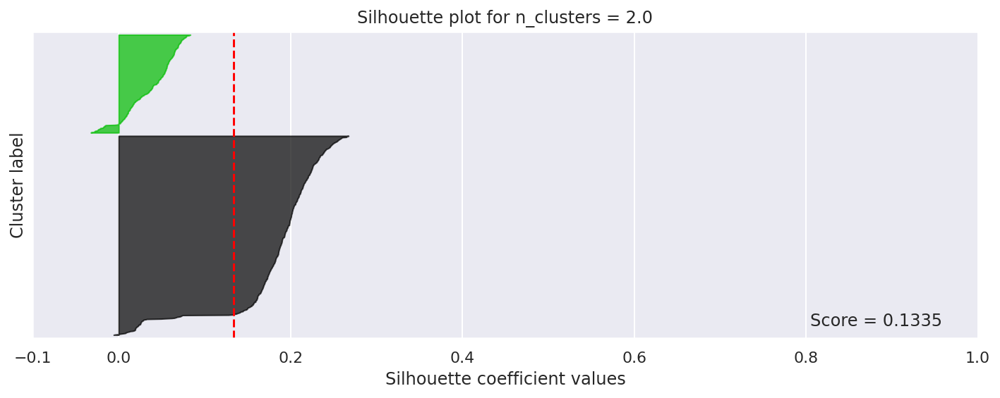

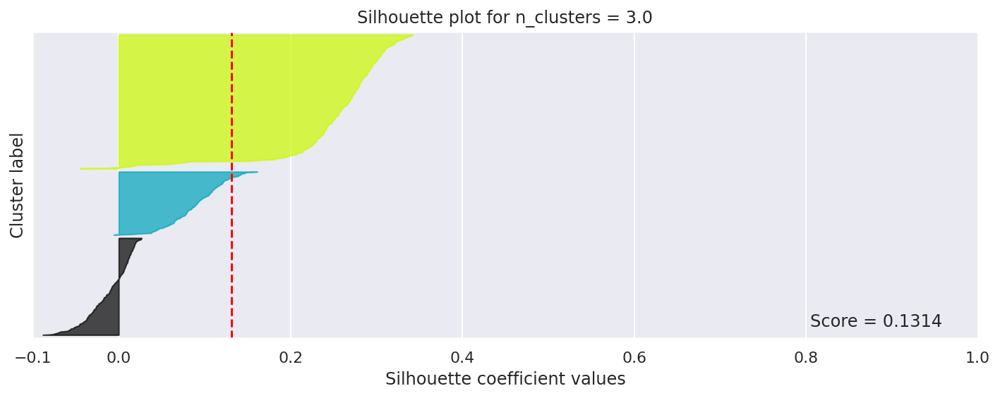

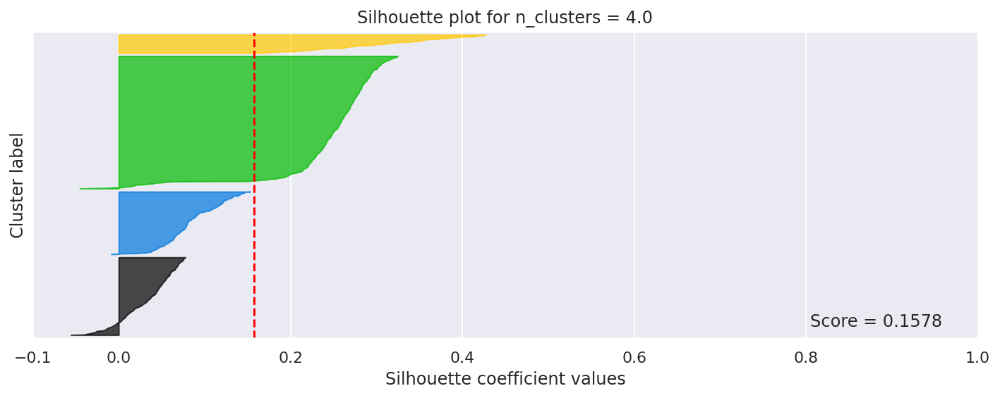

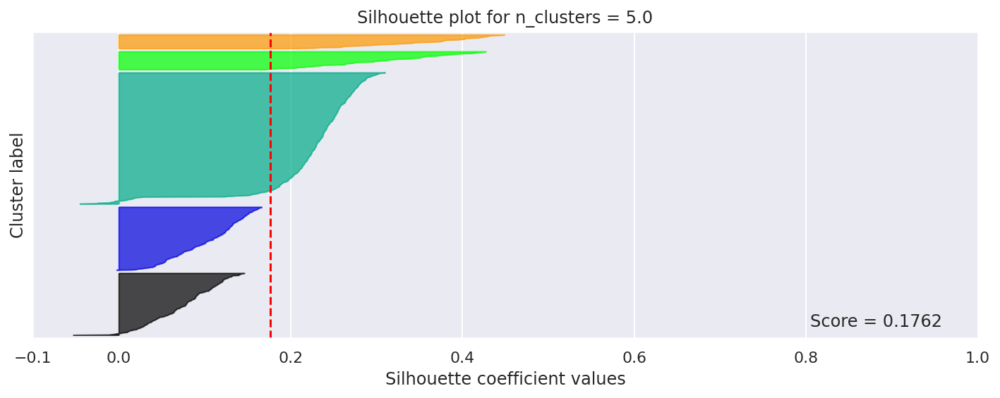

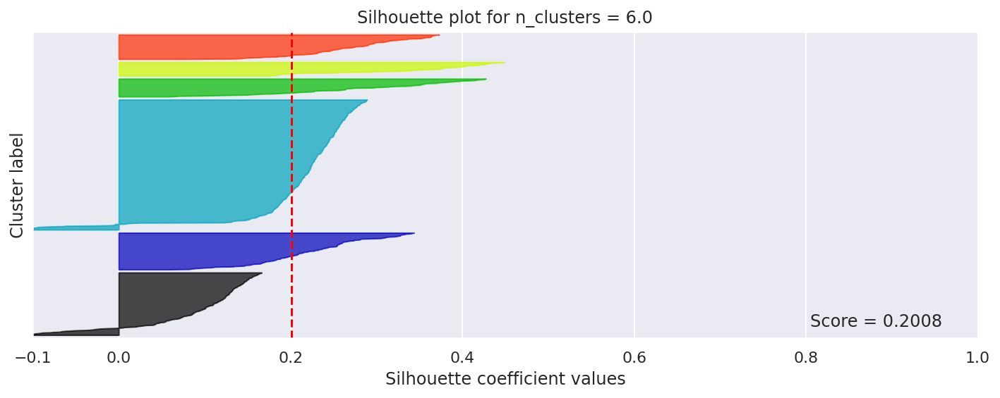

...

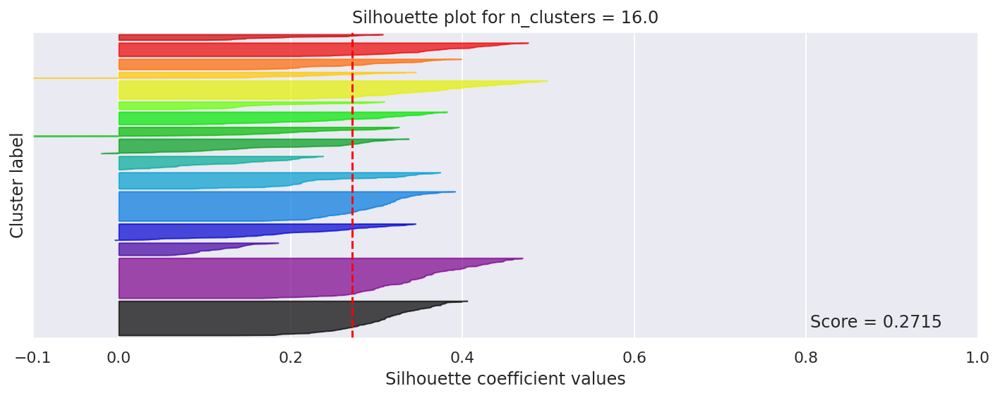

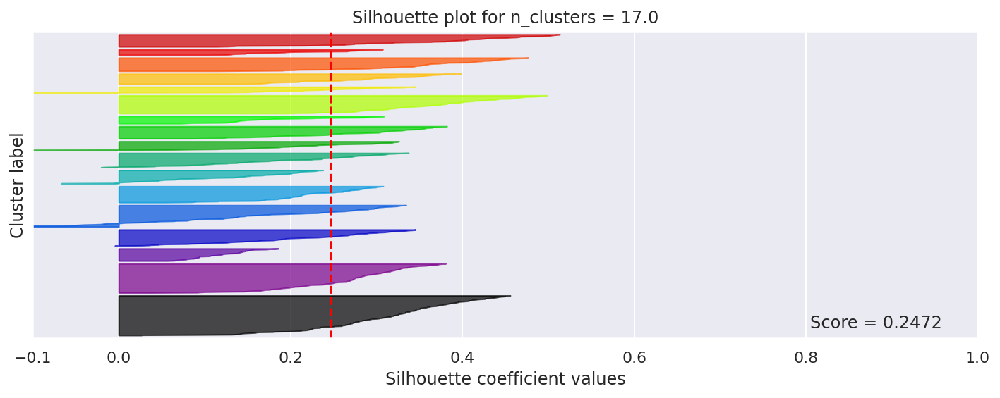

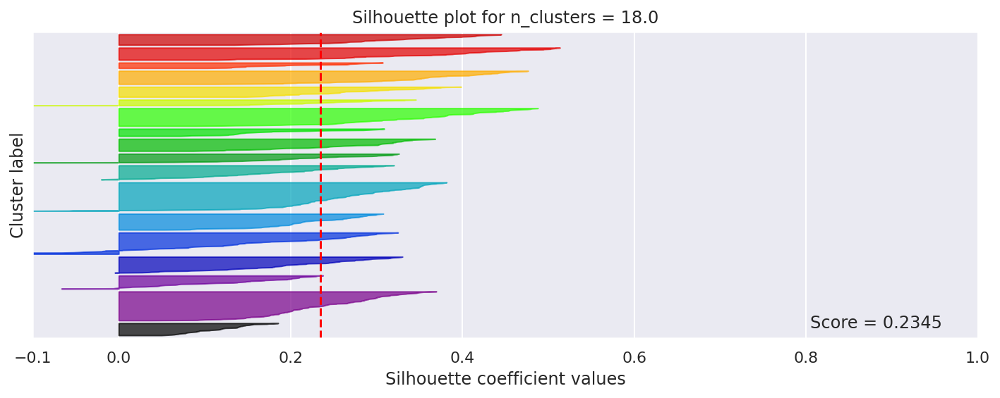

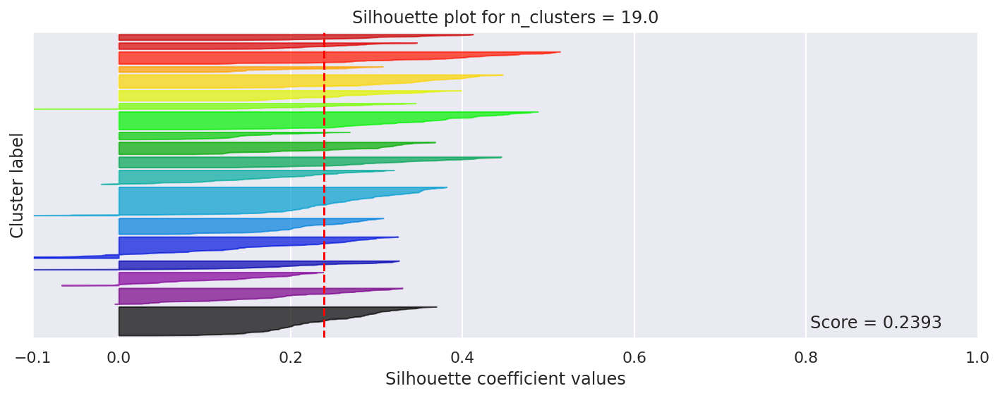

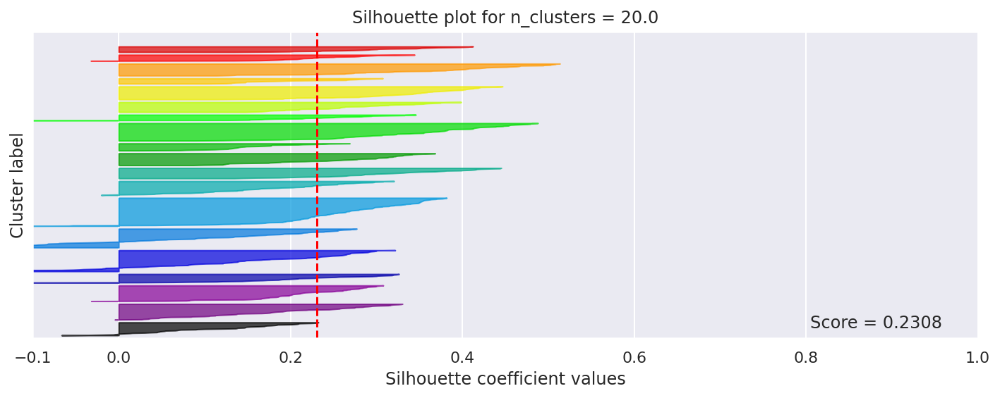

Max silhuette score is 0.2715 for n_clusters = 16.0

Let's find the number of clusters with max value of min Silhuette score,  
    i.e. with minimum overlap.



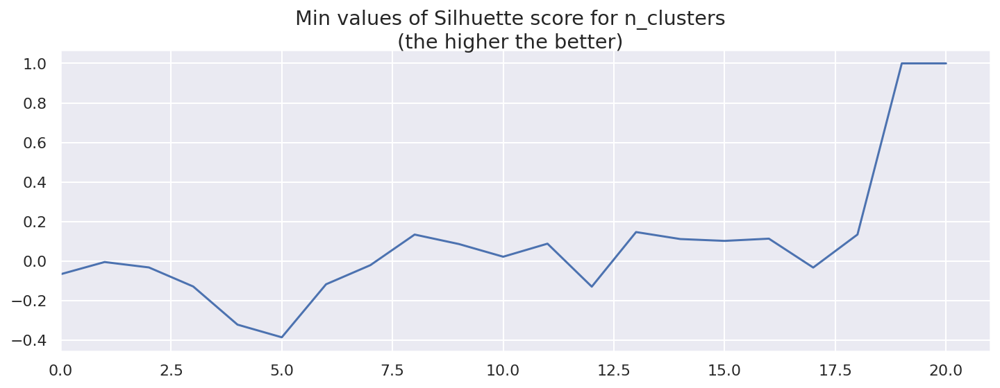

Best keys with max values of min silhuette scores : [19.0, 20.0, 13.0]


n_clusters,2.0,3.0,4.0,5.0,6.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,15.0,16.0,17.0,18.0,19.0,20.0
Silhuette score,0.1335,0.1314,0.1578,0.1762,0.2008,0.2160,0.2376,0.2124,0.2286,0.2395,0.2480,0.2550,0.2594,0.2655,0.2715,0.2472,0.2345,0.2393,0.2308


In [36]:
# Linkage methods: ward, complete, average, single
pp = {"min": 2, "max": 20, "steps": 19, "linkage": "ward"}
silhuette_study(model=AgglomerativeClustering, **pp)

``` 
Linkage      Clusters      Score
_________________________________
Average:            2      0.2354
Complete:          16      0.1771
Single:             2      0.2354
Ward:              16      0.2715


Ward linkage is the clear winner with 16 clusters and Silhuette score of 0.2715

### Dimensionality reduction - PCA, UMAP, T-SNE

In [37]:
def dim_reduction(X, dim_reduction=PCA(), n_clusters=4):

    # Before:
    kmeans = KMeans(n_clusters, random_state=random_state)
    X_clust = kmeans.fit_transform(X)

    fig, ax = plt.subplots(nrows=1, ncols=2)
    ax[0].scatter(X_clust[:, 0], X_clust[:, 1], s=20,
                  c=kmeans.labels_.astype(float), cmap="coolwarm")
    ax[0].set_xlabel("X0")
    ax[0].set_ylabel("X1")

    # After
    X_transf = dim_reduction.fit_transform(X_clust)
    ax[1].scatter(X_transf[:, 0], X_transf[:, 1], s=20,
                  c=kmeans.labels_.astype(float), cmap="coolwarm")
    p = re.compile("^[^\(]*")

    plt.suptitle(
        f"""Scatterplot of the first two features (X0, X1)
           in {n_clusters} clusters before and after {p.search(str(dim_reduction)).group()}""")
    ax[1].set_xlabel("X0")
    ax[1].set_ylabel("X1")
    plt.show()

#### Clusters before and after PCA

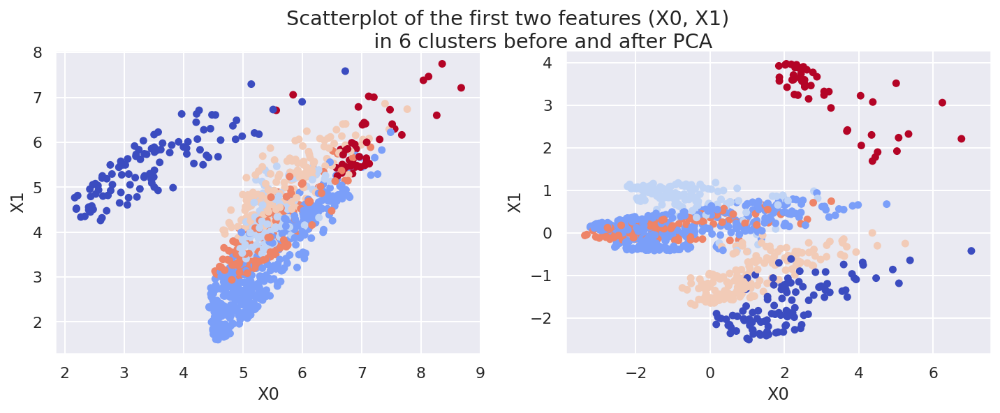

In [38]:
dim_reduction(X, PCA(), n_clusters=6)

The clusters are better separated, although not ideally, after PCA procedure. We can observe transformation of purely ribbon clusters to a ribbon/blob mixture.

###  TSNE and UMAP

#### TSNE transform

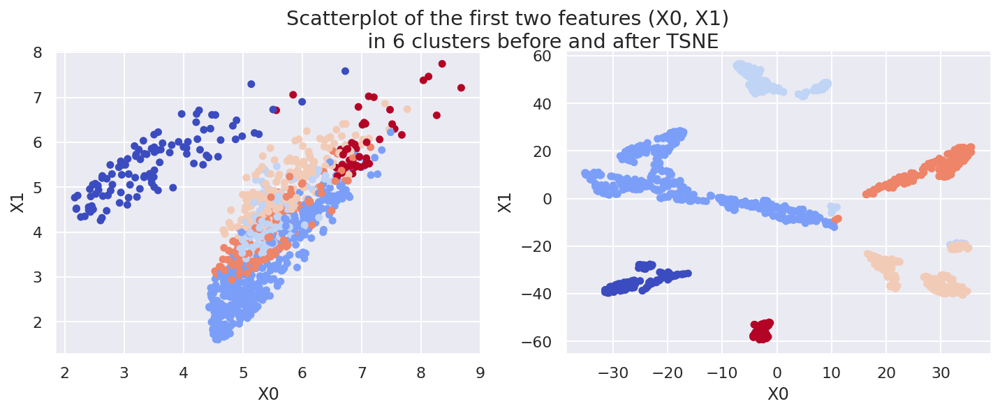

In [39]:
dim_reduction(X.values, TSNE(), n_clusters=6)

Separation after TSNE is somewhat more pronounced, but still not ideal.

#### UMAP transform

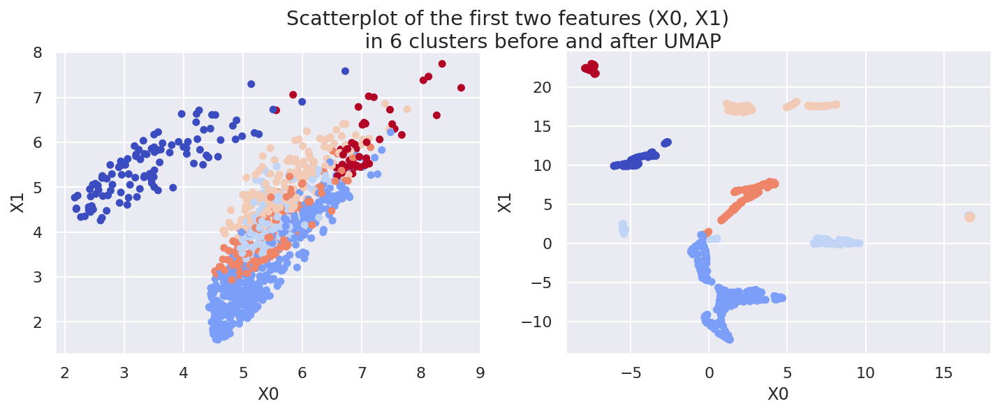

In [40]:
dim_reduction(X, UMAP(), n_clusters=6)

Here UMAP achieves the best separation of clusters.

#### Let's play a bit more, and try 3D with the full set of features

In [41]:
def visualize(model, **p):
    mdl = model(**p)
    X_clust = mdl.fit(X)
    X_color = X_clust.labels_.astype(str)
    features = X.values
    n_features = features.shape[1]

    # PCA
    pca = PCA()
    projections = pca.fit_transform(features)

    fig = px.scatter(
        projections, x=0, y=1,
        color=X_color, labels={'color': 'clusters'},
        title=f"PCA projection",
        width=720, height=480,
        template="plotly_dark")
    fig.show()

    # TSNE
    tsne2d = TSNE(n_components=2, random_state=random_state)
    tsne3d = TSNE(n_components=3, random_state=random_state)

    proj2d = tsne2d.fit_transform(features)
    proj3d = tsne3d.fit_transform(features)

    fig2t = px.scatter(
        proj2d, x=0, y=1,
        color=X_color, labels={'color': 'cluster'},
        title=f"TSNE-2d projection",
        width=720, height=480,
        template="plotly_dark"
    )
    fig2t.show()

    fig3t = px.scatter_3d(
        proj3d, x=0, y=1, z=2,
        color=X_color, labels={'color': 'cluster'},
        title=f"TSNE-3d projection",
        width=720, height=480,
        template="plotly_dark"
    )
    fig3t.update_traces(marker_size=8)
    fig3t.show()

    # UMAP
    umap_2d = UMAP(n_components=2, init='random',
                   random_state=random_state)
    umap_3d = UMAP(n_components=3, init='random',
                   random_state=random_state)

    proj_2d = umap_2d.fit_transform(features)
    proj_3d = umap_3d.fit_transform(features)

    fig_2d = px.scatter(
        proj_2d, x=0, y=1,
        color=X_color, labels={'color': 'clusters'},
        title=f"UMAP-2d projection",
        width=720, height=480,
        template="plotly_dark"
    )
    fig_2d.show()

    fig_3d = px.scatter_3d(
        proj_3d, x=0, y=1, z=2,
        color=X_color, labels={'color': 'clusters'},
        title=f"UMAP-3d projection",
        width=720, height=480,
        template="plotly_dark"
    )
    fig_3d.update_traces(marker_size=5)
    fig_3d.show()

    cln, cl_size = np.unique(X_color, return_counts=True)
    clusters = pd.DataFrame(cl_size, index=cln).T.rename(
        index=({0: "Cluster size"}))
    clusters.rename_axis(columns=["Cluster #"], inplace=True)
    return(clusters)

##### Visualize for KMeans

In [42]:
pp = {"n_clusters": 3, "random_state": random_state}
visualize(KMeans, **pp)

Cluster #,0,1,2
Cluster size,430,287,283


##### Visualize for DBSCAN

In [43]:
pp = {"eps": 4.0, "min_samples": 10}
visualize(DBSCAN, **pp)

Cluster #,-1,0,1,2,3
Cluster size,21,56,831,50,42


### Features in clusters (DBSCAN)

#### Features' means by cluster

Let's choose a case with a smallish number of clusters to make our comparisons easier.

In [44]:
db = DBSCAN(eps=4, min_samples=10)
X_clust = db.fit(X)
X_color = X_clust.labels_

cln, cl_size = np.unique(X_color, return_counts=True)
clusters = pd.DataFrame(cl_size, index=cln).T.rename(
    index=({0: "Cluster size"}))
clusters.rename_axis(columns=["Cluster #"], inplace=True)
clusters

Cluster #,-1,0,1,2,3
Cluster size,21,56,831,50,42


In [45]:
means = X.groupby(X_color).mean()
means.rename_axis(index="Cluster", inplace=True)
means

,Age,Sex,Job,Housing_own,Housing_rent,Housing_free,Saving accounts_quite rich,Saving accounts_moderate,Saving accounts_little,Saving accounts_unknown,Saving accounts_rich,Checking account_unknown,Checking account_rich,Checking account_little,Checking account_moderate,Credit amount,Duration
Cluster,,,,,,,,,,,,,,,,,
-1,0.6602,0.1505,-0.1468,-1.0319,-0.1085,1.6515,1.1189,0.2733,-0.9151,-0.3652,1.1199,-0.5181,2.1748,-0.4093,-0.2597,-0.5514,-0.1503
0,0.0723,-0.1323,-0.1120,0.0934,0.0754,-0.2318,3.8730,-0.3448,-1.2058,-0.4863,-0.2233,0.5772,-0.2717,-0.3429,-0.1370,-0.2887,-0.2072
1,-0.0183,-0.0069,0.0110,0.0028,-0.0085,0.0065,-0.2582,0.0301,0.1705,0.0431,-0.2233,-0.0032,-0.2717,0.0761,0.0828,0.0456,0.0374
2,-0.0389,0.0189,-0.0922,0.2913,-0.1159,-0.2825,-0.2582,-0.1501,0.3409,-0.0286,-0.2233,-0.8101,3.6804,-0.6217,-0.5870,-0.2255,-0.3180
3,0.1483,0.1505,-0.1138,0.2766,-0.1085,-0.2702,-0.2582,-0.3448,-1.2058,-0.4863,4.4780,0.4068,-0.2717,-0.3562,0.0675,-0.1227,-0.0713


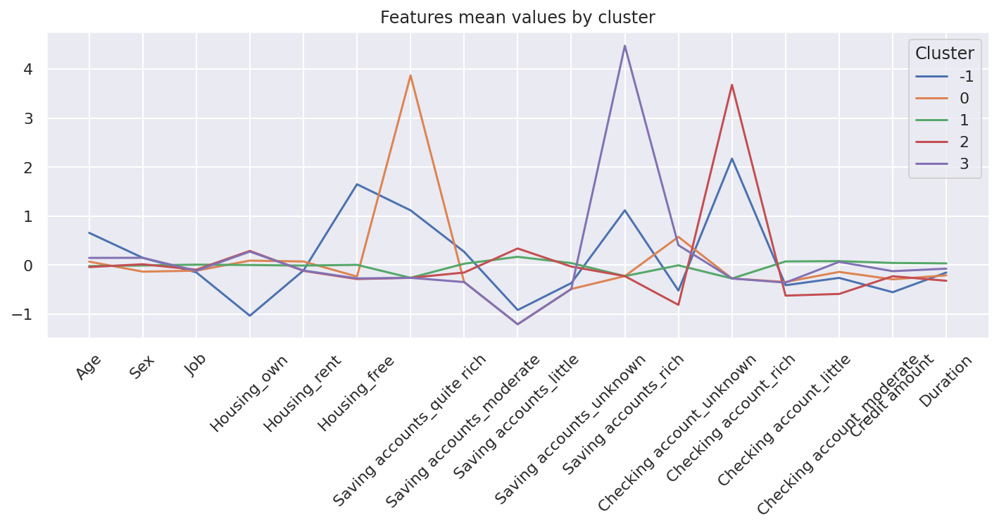

In [46]:
fig, ax = plt.subplots()
means.T.plot(rot=45, title="Features mean values by cluster",
             ax=ax) 
ax.set_xticks(np.arange(len(means.columns)))
ax.set_xticklabels(means.columns)
plt.show()

We can see that the most populous cluster 1 has much smaller variations around 0 than the smaller ones: -1, 0, 2, and 3.  
Positions of maxima of features vary significantly from one cluster to another. 

#### Boxplots of features by cluster

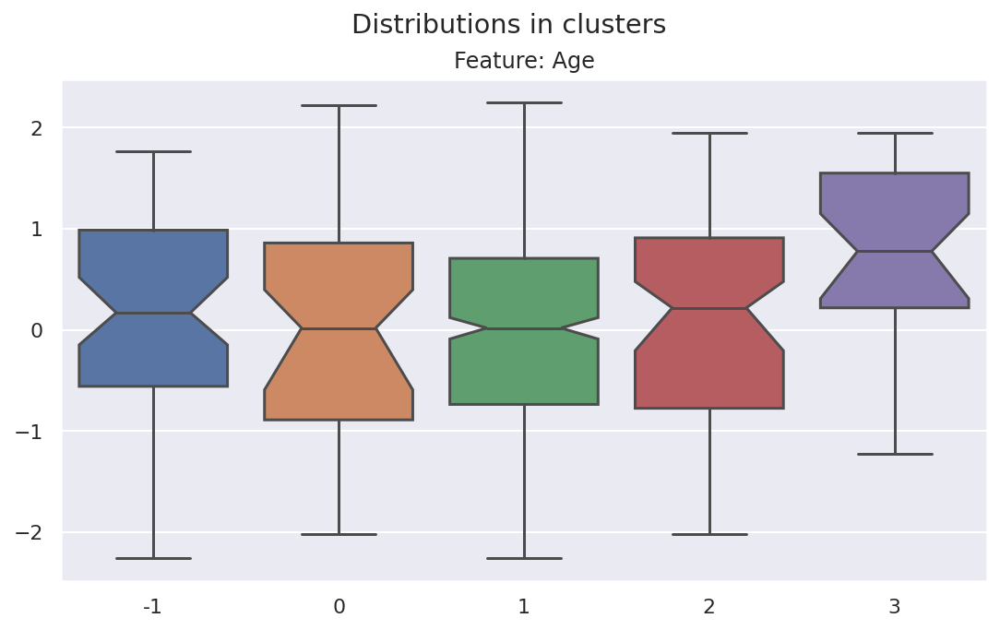

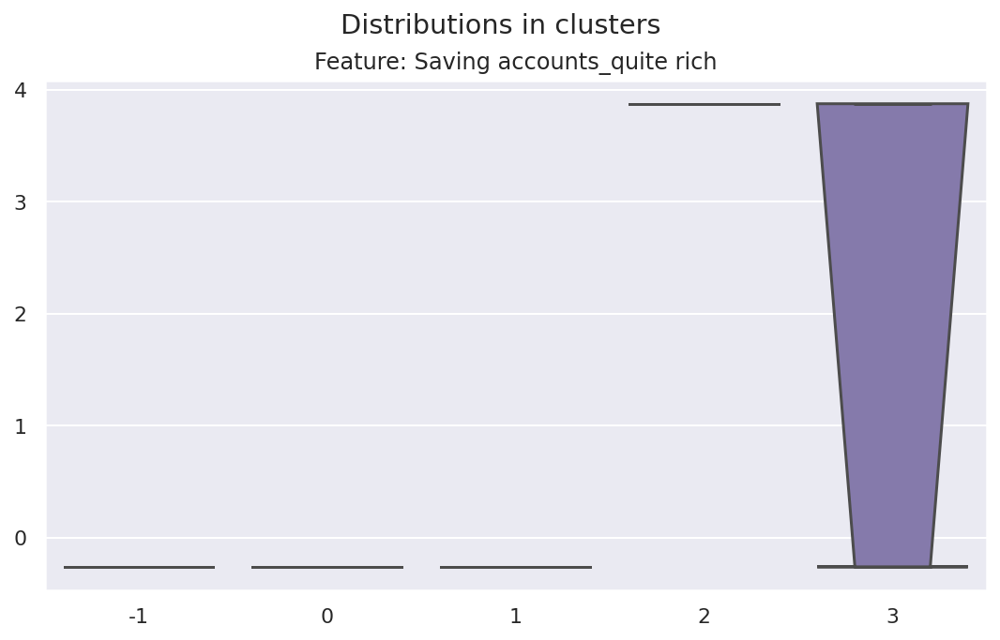

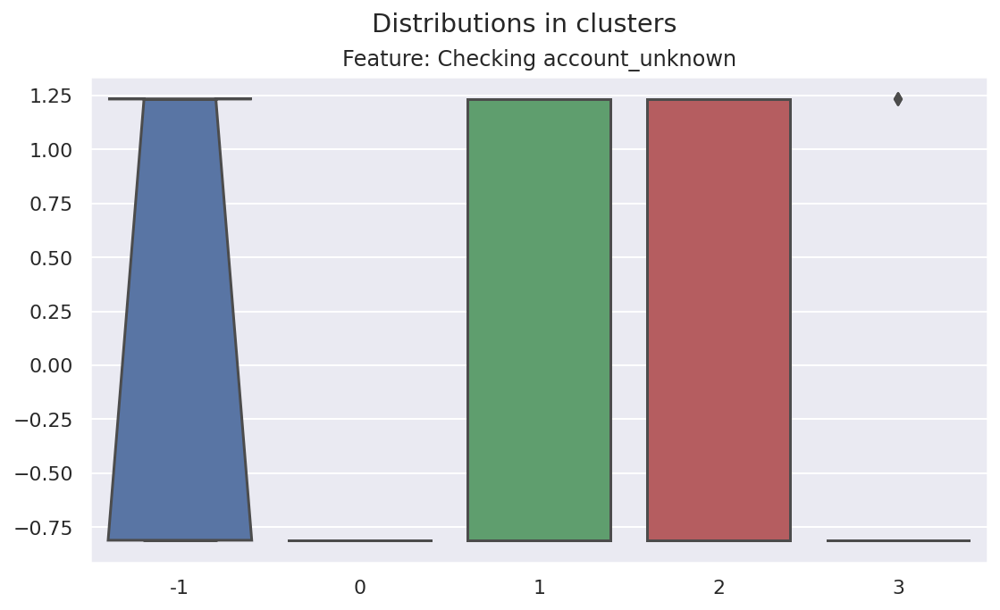

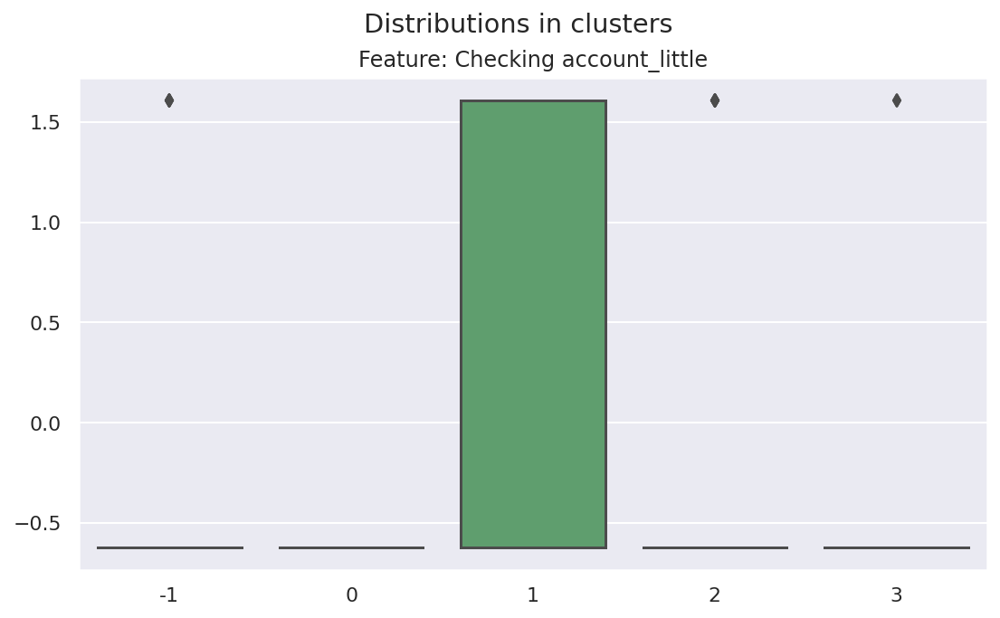

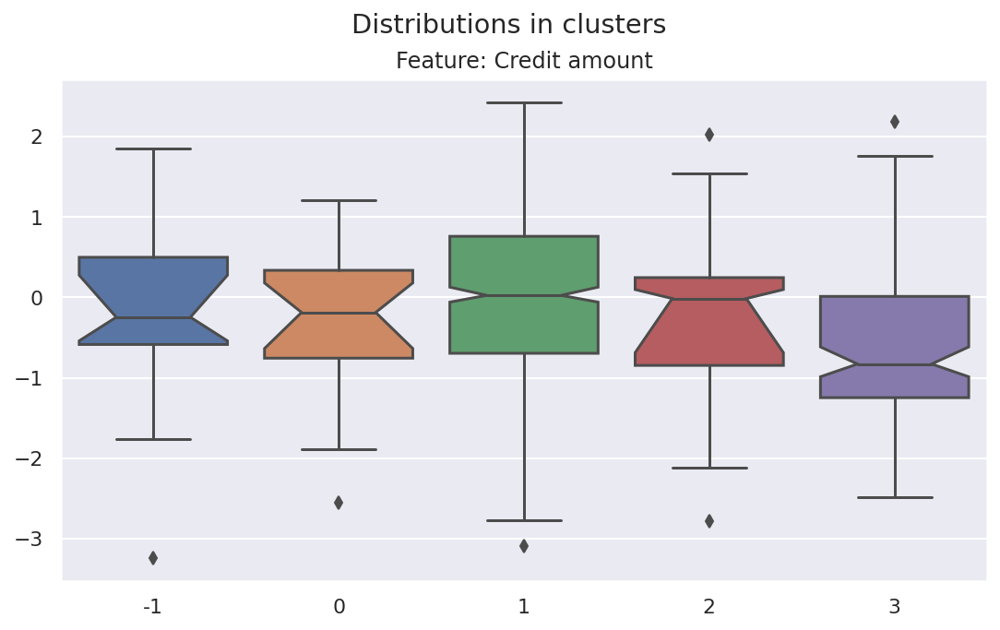

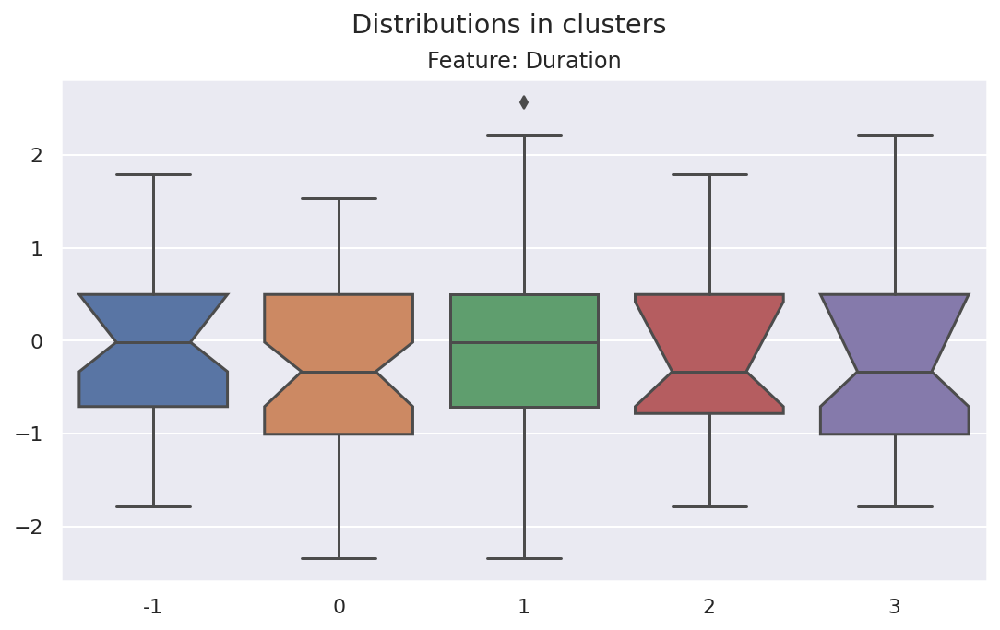

In [48]:
fig, ax = plt.subplots() 
for i, f in enumerate(X.columns[[0, 6, 11, 13, 15, 16]]):

    X_f = X.loc[np.where(X_color == np.unique(X_color)[0]), f]
    for cl in np.unique(X_color)[1:]: 
        X_f = pd.concat([X.loc[np.where(X_color == cl), f],
                        X_f], join="outer", ignore_index=True, axis=1)
    X_f = X_f[~np.isnan(X_f)]
    X_f.columns = range(-1, 4)
    cln, cl_size = np.unique(db.labels_, return_counts=True)
    ax = sns.boxplot(data=X_f, notch=True, bootstrap=5000)
    ax.set_title(f"Feature: {f}")
    plt.suptitle(
        f"Distributions in clusters")
    plt.show()

We see distinct separation of median feature values in clusters. Even if feature values for two clusters are similar, they will be significantly different for another feature. Please note that all features were "gaussed" in preprocessing, so the observed differences are not that pronounced.

### Some reflections

Although a number of metrics and methods provide measures of "success" in clustering, they may give widly varying estimates. In case of non-trivial cluster topology the outcome may significantly depend on the choice of H/Ps. In practical applications it may we worthwile to use several clusterings to have more "stereoscopic" vision. The crucial observation is that the choice of method and its respective H/Ps must follow from the problem at hand. Do we need rough segmentation in 2-3 groups or a more fine-grained analysis is needed? What are we looking for? There is some good news too: relatively simple analysis of means and variations of features in clusters provides a way to interpret the results, making this approach less of a black box than some other ML algorithms.